# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

SVHN Training Set: 182MB [02:27, 1.24MB/s]                              
SVHN Testing Set: 64.3MB [00:56, 1.14MB/s]                            


These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

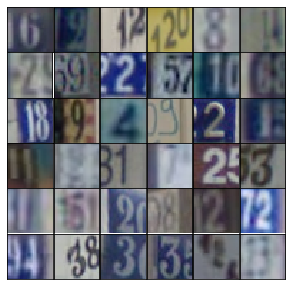

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. 
First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. 
We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [9]:
# Scale works the same as Tanh
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [10]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(self.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [11]:
def model_inputs(input_dim):
    # Input data to the modal
    inputs = tf.placeholder(tf.float32, (None, *input_dim), name=None)
    
    # Indices/output/target/classes data to the model
    indices = tf.placeholder(tf.int32, (None), name=None)    
    
    return inputs, indices

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [14]:
def encoder(inputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('encoder', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it to the number of classes 
        # Let's imagine (4*4*512) is the number of classes.
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, output_dim) # this is for the classification task
        predictions = tf.nn.softmax(logits)
        # 4x4x512 now
        
        return logits, predictions

In [15]:
def decoder(inputs, outputs, output_dim, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('decoder', reuse=reuse):
        # Prepare for fusing with outputs
        h1 = tf.layers.dense(inputs, output_dim)
        #h1 = tf.layers.dense(nl1_fused, 4*4*512)
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        nl1_fused = tf.concat(axis=1, values=[nl1, outputs])
        #nl1_mat = tf.reshape(nl1, (-1, 4, 4, 512))
        # 4x4x512 now

        h2 = tf.layers.dense(nl1_fused, 8*8*256)
        #h2 = tf.layers.conv2d_transpose(inputs=nl1_mat, filters=256, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x256 now
        
        h3 = tf.layers.dense(nl2, 16*16*128)
        #h3 = tf.layers.conv2d_transpose(inputs=nl2, filters=128, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 16x16x128 now
        
        # Output layer
        Qlogits = tf.layers.dense(nl3, 1, trainable=False)
        inputs_logits = tf.layers.conv2d_transpose(inputs=nl3, filters=output_dim, kernel_size=5, strides=2, 
                                                   padding='same', trainable=False)        
        predictions = tf.tanh(logits) # inputs data is scaled!
        # 32x32x3 now

        # generated input or input fake
        return predictions

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [12]:
def discriminator(inputs, reuse=False, alpha=0.1, training=True):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        h1 = tf.layers.conv2d(inputs=inputs, filters=64, kernel_size=5, strides=2, padding='same')
        bn1 = tf.layers.batch_normalization(h1, training=training)
        nl1 = tf.maximum(alpha * bn1, bn1)
        # 16x16x64
        
        h2 = tf.layers.conv2d(inputs=nl1, filters=128, kernel_size=5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(h2, training=training)
        nl2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        h3 = tf.layers.conv2d(inputs=nl2, filters=256, kernel_size=5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(h3, training=training)
        nl3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        nl3_vec = tf.reshape(nl3, (-1, 4*4*256))
        logits = tf.layers.dense(nl3_vec, 1)
        #predictions = tf.sigmoid(logits)
        
        return logits

## Model Loss

Calculating the loss like before, nothing new here.

In [13]:
# This is to determin the number of classes
trainset['y'].max(), trainset['y'].min()

(10, 1)

In [14]:
def model_loss(inputs_real, input_dim, indices_real, indices_dim):
    """
    Get the loss for the discriminator and generator
    :param inputs_real: Images from the real dataset
    :param input_dim: Input image dimensions
    :param indices_real: Target/output class/label numbers
    :param indices_dim: Number of output classes or dimensions
    :return: A tuple of (qfunction loss, generator loss, discriminator loss)
    """
    # Generating/reconstructing the fake inputs using real inputs
    q_logits, q_preds = qfunction(inputs=inputs_real, output_dim=indices_dim)
    inputs_fake = generator(inputs=q_preds, output_dim=input_dim)
    
    # Qfunction loss using real and fake inputs: Classification error
    q_loss = tf.reduce_mean(
        tf.nn.softmax_cross_entropy_with_logits_v2(logits=q_logits, 
                                                   labels=tf.one_hot(depth=indices_dim, indices=indices_real)))
    
    # Discriminator logits fake and real for G & D losses
    d_logits_fake = discriminator(inputs=tf.sigmoid(inputs_fake), reuse=False)
    d_logits_real = discriminator(inputs=tf.sigmoid(inputs_real), reuse=True)

    # Generator loss
    g_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.zeros_like(d_logits_real)))
    g_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))
    g_loss = g_loss_real + g_loss_fake

    # Reconstruction/prediction loss
    loss_reconst = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=inputs_fake, labels=tf.sigmoid(inputs_real)))
    q_loss += g_loss + loss_reconst
    g_loss += loss_reconst

    # Discriminator loss
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    d_loss = d_loss_real + d_loss_fake
    
    return q_loss, g_loss, d_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [15]:
def model_opt(q_loss, g_loss, d_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param q_loss: Qfunction loss Tensor
    :param g_loss: Generator loss Tensor
    :param d_loss: Discriminator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    q_vars = [var for var in t_vars if var.name.startswith('qfunction')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        q_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(q_loss, var_list=q_vars)
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    return q_opt, g_opt, d_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [16]:
class GAN:
    def __init__(self, input_dim, indices_dim, learning_rate, beta1):
        tf.reset_default_graph()
        
        # Model inputs/data 
        self.inputs_real, self.indices_real = model_inputs(input_dim=input_dim)
        
        # Model losses/logits
        self.q_loss, self.g_loss, self.d_loss = model_loss(inputs_real=self.inputs_real, input_dim=input_dim[2],
                                                           indices_real=self.indices_real, indices_dim=indices_dim)

        # Model update/optimization
        self.q_opt, self.g_opt, self.d_opt = model_opt(q_loss=self.q_loss, 
                                                       g_loss=self.g_loss, 
                                                       d_loss=self.d_loss, 
                                                       learning_rate=learning_rate, beta1=beta1)

Here is a function for displaying generated images.

In [17]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [18]:
def train(model, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    samples, losses = [], []
    steps = 0

    # Creating a session for training
    with tf.Session() as sess:
        
        # Initialize the model variable if there is no model available to load/restore
        sess.run(tf.global_variables_initializer())
        
        #         # Restore/load the trained model
        #         #saver.restore(sess, './checkpoints/model.ckpt')
        #         saver.restore(sess, tf.train.latest_checkpoint('checkpoints/'))
        
        # Number of epochs for updating the model/s
        for e in range(epochs):
            
            # Training batches
            for inputs_real, indices_real in dataset.batches(batch_size):
                steps += 1

                # Run optimizers
                feed_dict={model.inputs_real: inputs_real, model.indices_real: indices_real}
                _ = sess.run(model.q_opt, feed_dict)
                _ = sess.run(model.g_opt, feed_dict)
                _ = sess.run(model.d_opt, feed_dict)

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    q_loss = model.q_loss.eval(feed_dict)
                    g_loss = model.g_loss.eval(feed_dict)
                    d_loss = model.d_loss.eval(feed_dict)

                    print("Epoch {}/{}".format(e+1, epochs),
                          "Qfunction Loss:{:.4f}".format(q_loss),
                          "Generator Loss:{:.4f}".format(g_loss),
                          "Discriminator Loss:{:.4f}".format(d_loss))
                    
                    # Save losses to view after training
                    losses.append((q_loss, g_loss, d_loss))

                if steps % show_every == 0:
                    _, model_qpreds = qfunction(inputs=model.inputs_real, output_dim=10, reuse=True, training=False)
                    model_glogits = generator(inputs=model_qpreds, output_dim=3, reuse=True, training=False)
                    glogits = sess.run(model_glogits, feed_dict)
                    #reconst_inputs = glogits
                    samples.append(glogits)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        # Save the trained model
        saver.save(sess, './checkpoints/model4.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [19]:
# ADAM default parameters
# __init__(
#     learning_rate=0.001,
#     beta1=0.9,
#     beta2=0.999,
#     epsilon=1e-08,
#     use_locking=False,
#     name='Adam'
# )

In [20]:
# Dataset for the model
dataset = Dataset(trainset, testset)

In [21]:
dataset.train_y.shape, dataset.train_y.max()

((73257, 1), 10)

In [22]:
image_size = (32,32,3)
num_classes = 10
learning_rate = 0.001
beta1 = 0.5
batch_size = 128
epochs = 10
alpha = 0.1

# Create the network
model = GAN(input_dim=image_size, indices_dim=num_classes, learning_rate=learning_rate, beta1=beta1)

Epoch 1/10 Qfunction Loss:6.6357 Generator Loss:3.8909 Discriminator Loss:1.3907
Epoch 1/10 Qfunction Loss:6.1497 Generator Loss:3.8909 Discriminator Loss:0.6522
Epoch 1/10 Qfunction Loss:6.1370 Generator Loss:3.8291 Discriminator Loss:0.7713
Epoch 1/10 Qfunction Loss:5.4655 Generator Loss:3.3157 Discriminator Loss:1.0719
Epoch 1/10 Qfunction Loss:5.5075 Generator Loss:3.3268 Discriminator Loss:0.8672
Epoch 1/10 Qfunction Loss:5.9017 Generator Loss:3.8584 Discriminator Loss:0.8684
Epoch 1/10 Qfunction Loss:5.8779 Generator Loss:3.8228 Discriminator Loss:0.8420
Epoch 1/10 Qfunction Loss:5.3077 Generator Loss:3.2574 Discriminator Loss:0.7803
Epoch 1/10 Qfunction Loss:4.8760 Generator Loss:3.0226 Discriminator Loss:0.8469
Epoch 1/10 Qfunction Loss:4.0957 Generator Loss:2.6829 Discriminator Loss:1.0875


/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


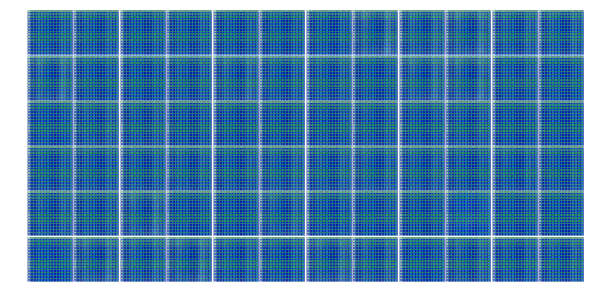

Epoch 1/10 Qfunction Loss:3.8295 Generator Loss:2.6691 Discriminator Loss:1.1766
Epoch 1/10 Qfunction Loss:3.9160 Generator Loss:2.6729 Discriminator Loss:1.0797
Epoch 1/10 Qfunction Loss:3.6968 Generator Loss:2.6510 Discriminator Loss:1.2211
Epoch 1/10 Qfunction Loss:3.8224 Generator Loss:3.0667 Discriminator Loss:0.9200
Epoch 1/10 Qfunction Loss:3.2464 Generator Loss:2.4377 Discriminator Loss:1.2146
Epoch 1/10 Qfunction Loss:3.3825 Generator Loss:2.6361 Discriminator Loss:1.0626
Epoch 1/10 Qfunction Loss:3.8688 Generator Loss:3.1568 Discriminator Loss:0.8028
Epoch 1/10 Qfunction Loss:3.3282 Generator Loss:2.4777 Discriminator Loss:1.1589
Epoch 1/10 Qfunction Loss:3.2821 Generator Loss:2.6420 Discriminator Loss:1.1152
Epoch 1/10 Qfunction Loss:3.8824 Generator Loss:3.1201 Discriminator Loss:0.8441


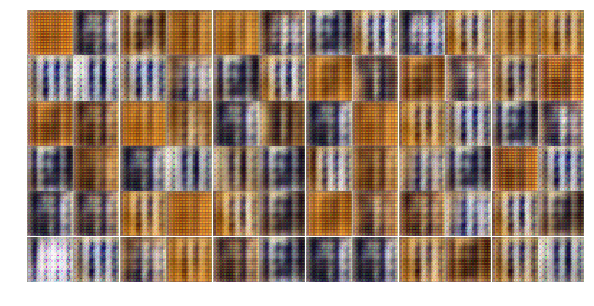

Epoch 1/10 Qfunction Loss:3.4899 Generator Loss:2.8818 Discriminator Loss:1.4081
Epoch 1/10 Qfunction Loss:3.5751 Generator Loss:2.9143 Discriminator Loss:1.0385
Epoch 1/10 Qfunction Loss:4.5948 Generator Loss:2.8203 Discriminator Loss:1.0951
Epoch 1/10 Qfunction Loss:3.9646 Generator Loss:3.2939 Discriminator Loss:1.0027
Epoch 1/10 Qfunction Loss:3.6928 Generator Loss:2.8498 Discriminator Loss:1.0938
Epoch 1/10 Qfunction Loss:3.6436 Generator Loss:2.7335 Discriminator Loss:1.0386
Epoch 1/10 Qfunction Loss:3.6649 Generator Loss:2.8285 Discriminator Loss:1.0098
Epoch 1/10 Qfunction Loss:3.4749 Generator Loss:2.8517 Discriminator Loss:1.0362
Epoch 1/10 Qfunction Loss:3.6165 Generator Loss:3.0264 Discriminator Loss:1.0042
Epoch 1/10 Qfunction Loss:3.2185 Generator Loss:2.6569 Discriminator Loss:1.0925


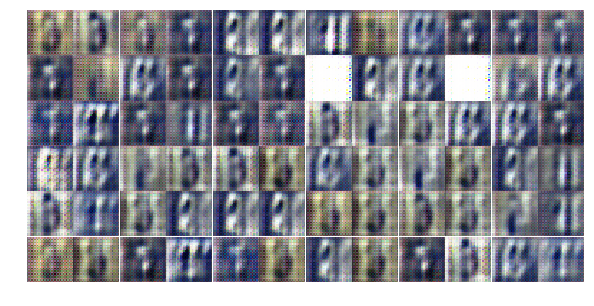

Epoch 1/10 Qfunction Loss:3.2990 Generator Loss:2.6884 Discriminator Loss:1.0283
Epoch 1/10 Qfunction Loss:3.2956 Generator Loss:2.7079 Discriminator Loss:1.0787
Epoch 1/10 Qfunction Loss:3.7040 Generator Loss:2.7786 Discriminator Loss:1.0986
Epoch 1/10 Qfunction Loss:3.5560 Generator Loss:2.8292 Discriminator Loss:1.0285
Epoch 1/10 Qfunction Loss:3.2555 Generator Loss:2.6190 Discriminator Loss:1.1651
Epoch 1/10 Qfunction Loss:3.3337 Generator Loss:2.7828 Discriminator Loss:0.9512
Epoch 1/10 Qfunction Loss:4.0042 Generator Loss:2.8710 Discriminator Loss:0.9647
Epoch 1/10 Qfunction Loss:3.4428 Generator Loss:2.8063 Discriminator Loss:0.9570
Epoch 1/10 Qfunction Loss:4.0362 Generator Loss:3.2094 Discriminator Loss:1.0918
Epoch 1/10 Qfunction Loss:3.2447 Generator Loss:2.6675 Discriminator Loss:1.0178


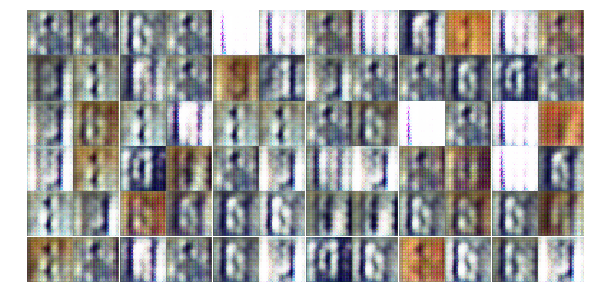

Epoch 1/10 Qfunction Loss:3.2843 Generator Loss:2.8545 Discriminator Loss:1.1312
Epoch 1/10 Qfunction Loss:4.3407 Generator Loss:2.7434 Discriminator Loss:1.1193
Epoch 1/10 Qfunction Loss:3.8240 Generator Loss:3.1904 Discriminator Loss:1.1139
Epoch 1/10 Qfunction Loss:4.4178 Generator Loss:3.2354 Discriminator Loss:0.8642
Epoch 1/10 Qfunction Loss:3.1044 Generator Loss:2.4155 Discriminator Loss:1.2290
Epoch 1/10 Qfunction Loss:4.0727 Generator Loss:3.4086 Discriminator Loss:0.8458
Epoch 1/10 Qfunction Loss:3.6080 Generator Loss:2.5866 Discriminator Loss:1.0918
Epoch 1/10 Qfunction Loss:3.7269 Generator Loss:2.6558 Discriminator Loss:1.0803
Epoch 1/10 Qfunction Loss:3.2528 Generator Loss:2.7354 Discriminator Loss:0.9881
Epoch 1/10 Qfunction Loss:3.2852 Generator Loss:2.6224 Discriminator Loss:1.0349


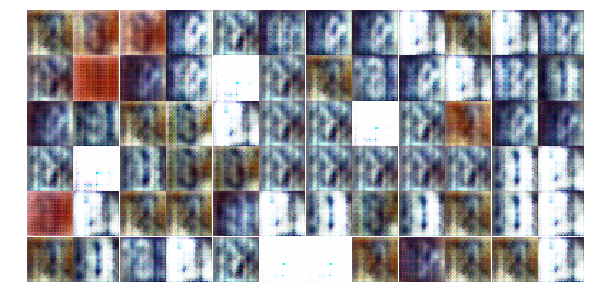

Epoch 1/10 Qfunction Loss:4.0258 Generator Loss:2.9390 Discriminator Loss:1.3104
Epoch 1/10 Qfunction Loss:3.8885 Generator Loss:2.8524 Discriminator Loss:1.3494
Epoch 1/10 Qfunction Loss:3.7303 Generator Loss:3.0198 Discriminator Loss:1.1053
Epoch 1/10 Qfunction Loss:4.1473 Generator Loss:2.8573 Discriminator Loss:1.1633
Epoch 1/10 Qfunction Loss:4.5666 Generator Loss:3.1186 Discriminator Loss:0.9430
Epoch 1/10 Qfunction Loss:3.7720 Generator Loss:2.9777 Discriminator Loss:0.8565
Epoch 1/10 Qfunction Loss:3.7538 Generator Loss:2.4921 Discriminator Loss:1.2912
Epoch 2/10 Qfunction Loss:3.4045 Generator Loss:2.6077 Discriminator Loss:1.0687
Epoch 2/10 Qfunction Loss:4.5228 Generator Loss:3.0530 Discriminator Loss:0.8691
Epoch 2/10 Qfunction Loss:4.4912 Generator Loss:3.2010 Discriminator Loss:1.0048


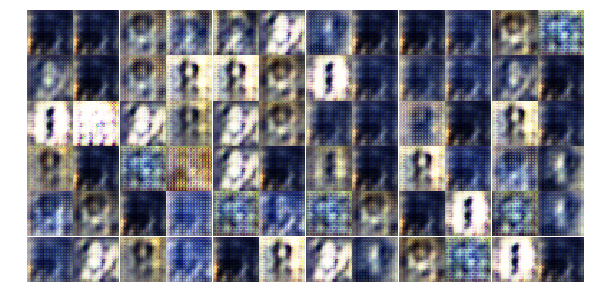

Epoch 2/10 Qfunction Loss:4.0948 Generator Loss:3.1121 Discriminator Loss:1.3818
Epoch 2/10 Qfunction Loss:3.7072 Generator Loss:3.2481 Discriminator Loss:1.1059
Epoch 2/10 Qfunction Loss:4.7965 Generator Loss:3.2436 Discriminator Loss:1.2945
Epoch 2/10 Qfunction Loss:4.0253 Generator Loss:3.3433 Discriminator Loss:0.7636
Epoch 2/10 Qfunction Loss:4.3667 Generator Loss:3.0275 Discriminator Loss:0.8626
Epoch 2/10 Qfunction Loss:3.9888 Generator Loss:3.2070 Discriminator Loss:0.8046
Epoch 2/10 Qfunction Loss:4.1598 Generator Loss:2.8576 Discriminator Loss:1.0325
Epoch 2/10 Qfunction Loss:5.6743 Generator Loss:3.1045 Discriminator Loss:0.9992
Epoch 2/10 Qfunction Loss:3.9868 Generator Loss:3.2463 Discriminator Loss:0.7857
Epoch 2/10 Qfunction Loss:4.6569 Generator Loss:3.1104 Discriminator Loss:0.8570


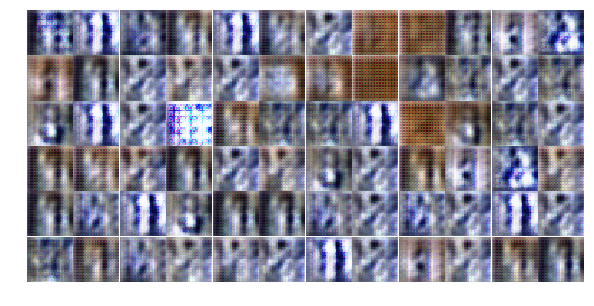

Epoch 2/10 Qfunction Loss:5.3331 Generator Loss:2.9709 Discriminator Loss:0.8862
Epoch 2/10 Qfunction Loss:4.2423 Generator Loss:2.8579 Discriminator Loss:1.0013
Epoch 2/10 Qfunction Loss:3.6643 Generator Loss:2.9570 Discriminator Loss:0.9851
Epoch 2/10 Qfunction Loss:4.0981 Generator Loss:3.0839 Discriminator Loss:0.8790
Epoch 2/10 Qfunction Loss:5.0191 Generator Loss:3.8273 Discriminator Loss:1.3365
Epoch 2/10 Qfunction Loss:4.1402 Generator Loss:3.2210 Discriminator Loss:1.0983
Epoch 2/10 Qfunction Loss:3.4283 Generator Loss:2.8578 Discriminator Loss:0.9543
Epoch 2/10 Qfunction Loss:3.9269 Generator Loss:3.2280 Discriminator Loss:0.9085
Epoch 2/10 Qfunction Loss:3.9106 Generator Loss:3.0305 Discriminator Loss:1.0195
Epoch 2/10 Qfunction Loss:3.8312 Generator Loss:2.8585 Discriminator Loss:0.9459


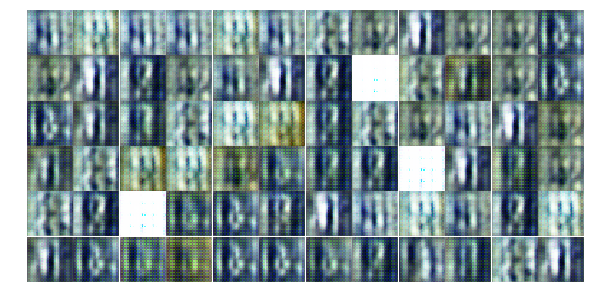

Epoch 2/10 Qfunction Loss:3.9981 Generator Loss:2.7491 Discriminator Loss:0.9946
Epoch 2/10 Qfunction Loss:4.4886 Generator Loss:3.5719 Discriminator Loss:1.0061
Epoch 2/10 Qfunction Loss:4.8683 Generator Loss:4.0713 Discriminator Loss:0.9696
Epoch 2/10 Qfunction Loss:4.2167 Generator Loss:2.7086 Discriminator Loss:1.2310
Epoch 2/10 Qfunction Loss:4.0963 Generator Loss:2.7605 Discriminator Loss:1.0354
Epoch 2/10 Qfunction Loss:5.3763 Generator Loss:3.4378 Discriminator Loss:1.1779
Epoch 2/10 Qfunction Loss:5.0745 Generator Loss:3.3273 Discriminator Loss:0.9819
Epoch 2/10 Qfunction Loss:4.8620 Generator Loss:3.2308 Discriminator Loss:0.8255
Epoch 2/10 Qfunction Loss:4.9834 Generator Loss:2.9821 Discriminator Loss:1.1535
Epoch 2/10 Qfunction Loss:4.9978 Generator Loss:3.0711 Discriminator Loss:0.8640


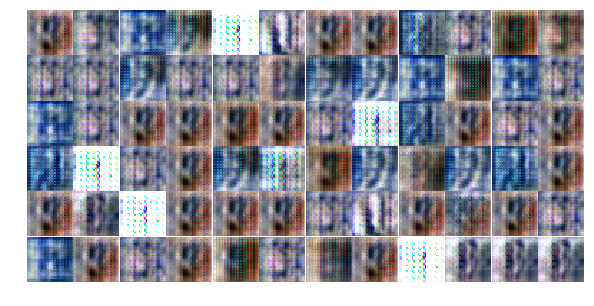

Epoch 2/10 Qfunction Loss:5.6151 Generator Loss:4.2144 Discriminator Loss:0.7391
Epoch 2/10 Qfunction Loss:7.7259 Generator Loss:3.9629 Discriminator Loss:2.1411
Epoch 2/10 Qfunction Loss:4.9468 Generator Loss:3.5203 Discriminator Loss:1.3105
Epoch 2/10 Qfunction Loss:4.1443 Generator Loss:2.9482 Discriminator Loss:1.0139
Epoch 2/10 Qfunction Loss:4.5994 Generator Loss:3.0194 Discriminator Loss:0.9965
Epoch 2/10 Qfunction Loss:4.3135 Generator Loss:3.1722 Discriminator Loss:0.7772
Epoch 2/10 Qfunction Loss:5.0242 Generator Loss:3.1717 Discriminator Loss:0.8505
Epoch 2/10 Qfunction Loss:3.6846 Generator Loss:3.1899 Discriminator Loss:1.1488
Epoch 2/10 Qfunction Loss:5.6596 Generator Loss:2.6909 Discriminator Loss:1.0651
Epoch 2/10 Qfunction Loss:4.6132 Generator Loss:2.8334 Discriminator Loss:0.9156


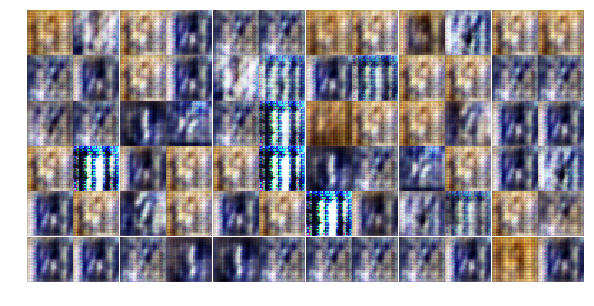

Epoch 2/10 Qfunction Loss:4.3920 Generator Loss:2.9672 Discriminator Loss:0.9337
Epoch 2/10 Qfunction Loss:5.0948 Generator Loss:2.3645 Discriminator Loss:1.2939
Epoch 2/10 Qfunction Loss:4.4119 Generator Loss:2.6834 Discriminator Loss:1.1295
Epoch 2/10 Qfunction Loss:3.9797 Generator Loss:3.0028 Discriminator Loss:0.9261
Epoch 2/10 Qfunction Loss:3.9931 Generator Loss:2.7337 Discriminator Loss:1.0533
Epoch 2/10 Qfunction Loss:3.8194 Generator Loss:2.8382 Discriminator Loss:1.0263
Epoch 2/10 Qfunction Loss:4.6880 Generator Loss:2.7876 Discriminator Loss:1.0020
Epoch 2/10 Qfunction Loss:4.5632 Generator Loss:2.9239 Discriminator Loss:1.1730
Epoch 2/10 Qfunction Loss:5.6870 Generator Loss:3.8834 Discriminator Loss:0.7052
Epoch 2/10 Qfunction Loss:3.3674 Generator Loss:2.5800 Discriminator Loss:1.1522


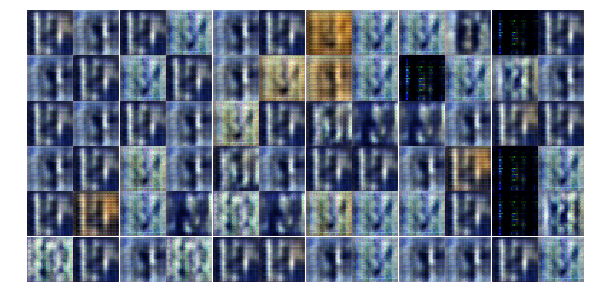

Epoch 2/10 Qfunction Loss:4.5571 Generator Loss:2.9758 Discriminator Loss:0.9195
Epoch 2/10 Qfunction Loss:3.2587 Generator Loss:2.4645 Discriminator Loss:1.1824
Epoch 2/10 Qfunction Loss:4.4837 Generator Loss:2.9586 Discriminator Loss:1.0162
Epoch 2/10 Qfunction Loss:5.1908 Generator Loss:3.2454 Discriminator Loss:0.9874
Epoch 3/10 Qfunction Loss:6.5589 Generator Loss:3.0389 Discriminator Loss:0.8849
Epoch 3/10 Qfunction Loss:5.0389 Generator Loss:3.0826 Discriminator Loss:0.8849
Epoch 3/10 Qfunction Loss:4.0074 Generator Loss:2.8556 Discriminator Loss:1.3975
Epoch 3/10 Qfunction Loss:4.1089 Generator Loss:2.7841 Discriminator Loss:1.1218
Epoch 3/10 Qfunction Loss:4.8149 Generator Loss:3.3367 Discriminator Loss:0.7227
Epoch 3/10 Qfunction Loss:6.5640 Generator Loss:3.2264 Discriminator Loss:0.7792


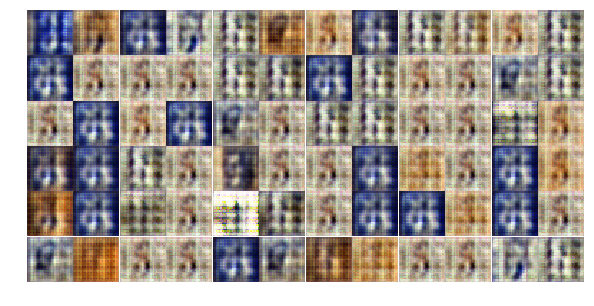

Epoch 3/10 Qfunction Loss:5.6118 Generator Loss:2.8605 Discriminator Loss:0.9809
Epoch 3/10 Qfunction Loss:3.7936 Generator Loss:2.7954 Discriminator Loss:1.1573
Epoch 3/10 Qfunction Loss:4.2006 Generator Loss:2.6141 Discriminator Loss:1.1765
Epoch 3/10 Qfunction Loss:5.3488 Generator Loss:2.6960 Discriminator Loss:1.0599
Epoch 3/10 Qfunction Loss:5.6503 Generator Loss:2.7709 Discriminator Loss:1.0860
Epoch 3/10 Qfunction Loss:3.9209 Generator Loss:2.9530 Discriminator Loss:0.9555
Epoch 3/10 Qfunction Loss:5.2602 Generator Loss:3.0563 Discriminator Loss:1.2892
Epoch 3/10 Qfunction Loss:5.2975 Generator Loss:3.0755 Discriminator Loss:0.9451
Epoch 3/10 Qfunction Loss:7.8242 Generator Loss:3.0062 Discriminator Loss:0.9699
Epoch 3/10 Qfunction Loss:4.3028 Generator Loss:3.2461 Discriminator Loss:0.9579


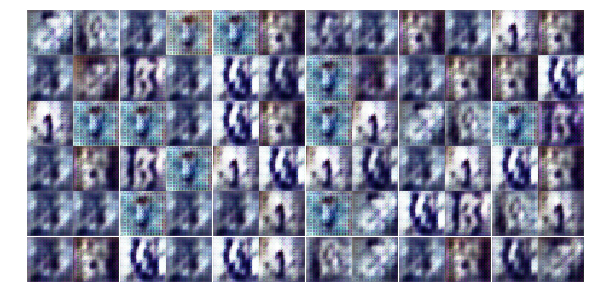

Epoch 3/10 Qfunction Loss:6.0749 Generator Loss:3.0308 Discriminator Loss:0.8922
Epoch 3/10 Qfunction Loss:4.9004 Generator Loss:3.0132 Discriminator Loss:0.8939
Epoch 3/10 Qfunction Loss:5.0648 Generator Loss:3.5853 Discriminator Loss:0.9787
Epoch 3/10 Qfunction Loss:5.7892 Generator Loss:2.8233 Discriminator Loss:1.0468
Epoch 3/10 Qfunction Loss:4.3219 Generator Loss:3.2962 Discriminator Loss:0.7801
Epoch 3/10 Qfunction Loss:5.8612 Generator Loss:3.2284 Discriminator Loss:1.1942
Epoch 3/10 Qfunction Loss:5.4516 Generator Loss:3.8118 Discriminator Loss:1.1495
Epoch 3/10 Qfunction Loss:4.3525 Generator Loss:2.9285 Discriminator Loss:1.1726
Epoch 3/10 Qfunction Loss:5.0503 Generator Loss:3.3544 Discriminator Loss:0.8120
Epoch 3/10 Qfunction Loss:6.3956 Generator Loss:3.2752 Discriminator Loss:0.8099


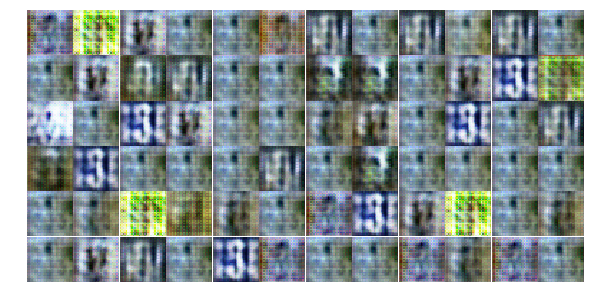

Epoch 3/10 Qfunction Loss:5.0521 Generator Loss:3.3704 Discriminator Loss:0.9737
Epoch 3/10 Qfunction Loss:5.4494 Generator Loss:3.0604 Discriminator Loss:1.1801
Epoch 3/10 Qfunction Loss:5.4481 Generator Loss:3.1598 Discriminator Loss:0.8390
Epoch 3/10 Qfunction Loss:6.4228 Generator Loss:4.0989 Discriminator Loss:0.5730
Epoch 3/10 Qfunction Loss:4.8328 Generator Loss:3.3718 Discriminator Loss:0.9086
Epoch 3/10 Qfunction Loss:10.3906 Generator Loss:4.1705 Discriminator Loss:0.5065
Epoch 3/10 Qfunction Loss:8.0017 Generator Loss:3.5338 Discriminator Loss:2.8203
Epoch 3/10 Qfunction Loss:4.6524 Generator Loss:2.3874 Discriminator Loss:1.2405
Epoch 3/10 Qfunction Loss:5.8119 Generator Loss:2.6684 Discriminator Loss:1.1761
Epoch 3/10 Qfunction Loss:5.9908 Generator Loss:2.5642 Discriminator Loss:1.2323


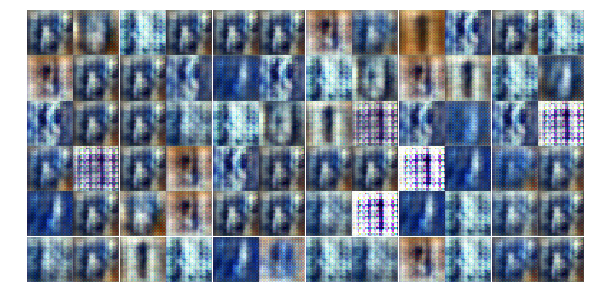

Epoch 3/10 Qfunction Loss:4.8385 Generator Loss:2.7663 Discriminator Loss:0.9937
Epoch 3/10 Qfunction Loss:4.0724 Generator Loss:2.8973 Discriminator Loss:0.9212
Epoch 3/10 Qfunction Loss:5.2996 Generator Loss:2.8064 Discriminator Loss:1.0879
Epoch 3/10 Qfunction Loss:4.9999 Generator Loss:2.8217 Discriminator Loss:1.0120
Epoch 3/10 Qfunction Loss:5.3149 Generator Loss:2.8480 Discriminator Loss:0.9269
Epoch 3/10 Qfunction Loss:5.3211 Generator Loss:2.7297 Discriminator Loss:1.0392
Epoch 3/10 Qfunction Loss:4.3629 Generator Loss:2.8716 Discriminator Loss:1.0237
Epoch 3/10 Qfunction Loss:5.9658 Generator Loss:3.5415 Discriminator Loss:0.7644
Epoch 3/10 Qfunction Loss:7.4757 Generator Loss:2.9266 Discriminator Loss:1.0734
Epoch 3/10 Qfunction Loss:5.1569 Generator Loss:3.1009 Discriminator Loss:1.1664


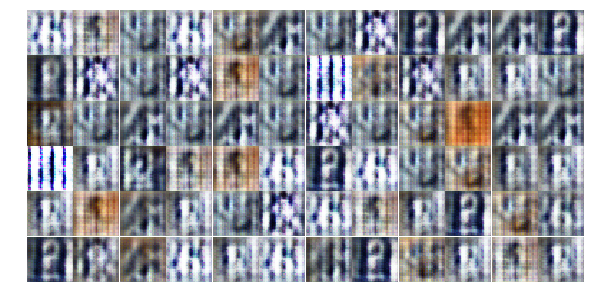

Epoch 3/10 Qfunction Loss:5.3986 Generator Loss:2.7898 Discriminator Loss:1.0536
Epoch 3/10 Qfunction Loss:5.8829 Generator Loss:3.3073 Discriminator Loss:1.2785
Epoch 3/10 Qfunction Loss:9.7647 Generator Loss:3.7172 Discriminator Loss:1.1277
Epoch 3/10 Qfunction Loss:6.8419 Generator Loss:3.5348 Discriminator Loss:0.8477
Epoch 3/10 Qfunction Loss:6.3575 Generator Loss:3.0262 Discriminator Loss:1.0336
Epoch 3/10 Qfunction Loss:3.8917 Generator Loss:3.2471 Discriminator Loss:0.7784
Epoch 3/10 Qfunction Loss:5.0511 Generator Loss:3.6990 Discriminator Loss:0.6312
Epoch 3/10 Qfunction Loss:4.8999 Generator Loss:3.2837 Discriminator Loss:0.9233
Epoch 3/10 Qfunction Loss:7.1294 Generator Loss:3.4398 Discriminator Loss:0.7341
Epoch 3/10 Qfunction Loss:5.4536 Generator Loss:3.3577 Discriminator Loss:0.8183


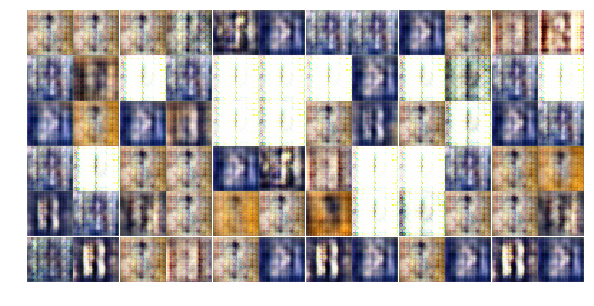

Epoch 3/10 Qfunction Loss:8.0124 Generator Loss:3.8657 Discriminator Loss:1.3473
Epoch 4/10 Qfunction Loss:6.4201 Generator Loss:3.1327 Discriminator Loss:1.1210
Epoch 4/10 Qfunction Loss:6.7245 Generator Loss:3.0880 Discriminator Loss:0.9442
Epoch 4/10 Qfunction Loss:4.7042 Generator Loss:3.6119 Discriminator Loss:0.7343
Epoch 4/10 Qfunction Loss:5.8587 Generator Loss:3.8471 Discriminator Loss:1.2793
Epoch 4/10 Qfunction Loss:5.1599 Generator Loss:3.3660 Discriminator Loss:0.9732
Epoch 4/10 Qfunction Loss:7.3823 Generator Loss:3.4234 Discriminator Loss:1.0821
Epoch 4/10 Qfunction Loss:5.2048 Generator Loss:3.4040 Discriminator Loss:0.8213
Epoch 4/10 Qfunction Loss:6.9396 Generator Loss:4.8090 Discriminator Loss:1.2911
Epoch 4/10 Qfunction Loss:4.7223 Generator Loss:3.3286 Discriminator Loss:0.9871


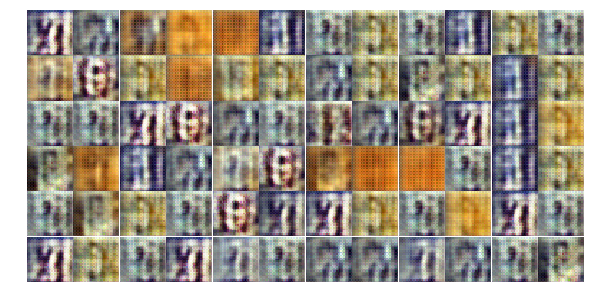

Epoch 4/10 Qfunction Loss:7.0119 Generator Loss:3.3688 Discriminator Loss:0.7776
Epoch 4/10 Qfunction Loss:6.3178 Generator Loss:2.9197 Discriminator Loss:0.9548
Epoch 4/10 Qfunction Loss:7.0890 Generator Loss:4.5138 Discriminator Loss:1.6918
Epoch 4/10 Qfunction Loss:5.7756 Generator Loss:3.1984 Discriminator Loss:0.8975
Epoch 4/10 Qfunction Loss:7.7265 Generator Loss:3.4055 Discriminator Loss:0.8896
Epoch 4/10 Qfunction Loss:8.8079 Generator Loss:3.0942 Discriminator Loss:0.9506
Epoch 4/10 Qfunction Loss:9.1356 Generator Loss:2.9725 Discriminator Loss:1.0347
Epoch 4/10 Qfunction Loss:5.8269 Generator Loss:3.1404 Discriminator Loss:0.9864
Epoch 4/10 Qfunction Loss:6.4794 Generator Loss:3.3544 Discriminator Loss:1.1566
Epoch 4/10 Qfunction Loss:6.6877 Generator Loss:3.7999 Discriminator Loss:0.6921


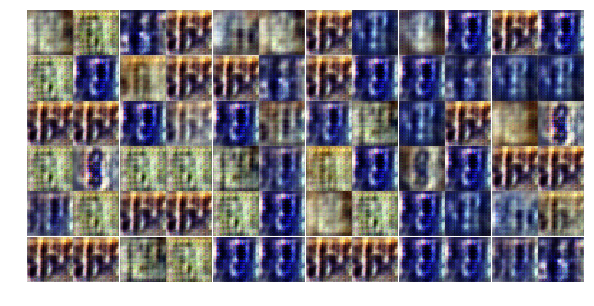

Epoch 4/10 Qfunction Loss:8.7535 Generator Loss:3.7642 Discriminator Loss:0.7477
Epoch 4/10 Qfunction Loss:6.3416 Generator Loss:4.3552 Discriminator Loss:1.3256
Epoch 4/10 Qfunction Loss:8.0465 Generator Loss:4.2930 Discriminator Loss:0.5407
Epoch 4/10 Qfunction Loss:8.4841 Generator Loss:3.2810 Discriminator Loss:0.7586
Epoch 4/10 Qfunction Loss:5.9630 Generator Loss:3.3045 Discriminator Loss:0.7635
Epoch 4/10 Qfunction Loss:5.4885 Generator Loss:3.8480 Discriminator Loss:0.9084
Epoch 4/10 Qfunction Loss:5.4817 Generator Loss:3.0281 Discriminator Loss:1.0252
Epoch 4/10 Qfunction Loss:6.4391 Generator Loss:3.1683 Discriminator Loss:0.9711
Epoch 4/10 Qfunction Loss:6.7655 Generator Loss:3.2011 Discriminator Loss:1.0271
Epoch 4/10 Qfunction Loss:4.1289 Generator Loss:2.8125 Discriminator Loss:1.0673


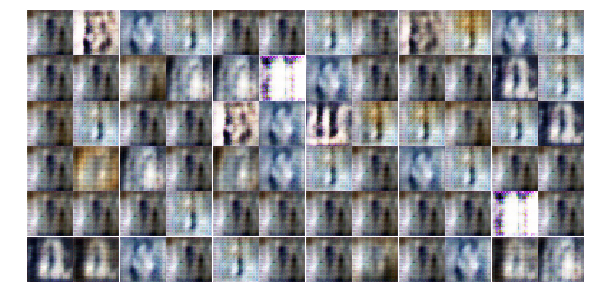

Epoch 4/10 Qfunction Loss:6.2273 Generator Loss:3.4363 Discriminator Loss:0.8596
Epoch 4/10 Qfunction Loss:4.1909 Generator Loss:3.2613 Discriminator Loss:0.8897
Epoch 4/10 Qfunction Loss:6.0302 Generator Loss:3.3915 Discriminator Loss:0.7764
Epoch 4/10 Qfunction Loss:6.2200 Generator Loss:3.4284 Discriminator Loss:0.6890
Epoch 4/10 Qfunction Loss:9.4168 Generator Loss:3.1704 Discriminator Loss:1.0421
Epoch 4/10 Qfunction Loss:4.9083 Generator Loss:3.2185 Discriminator Loss:0.8857
Epoch 4/10 Qfunction Loss:7.2292 Generator Loss:3.3321 Discriminator Loss:0.7978
Epoch 4/10 Qfunction Loss:6.0972 Generator Loss:3.3589 Discriminator Loss:0.8502
Epoch 4/10 Qfunction Loss:7.4104 Generator Loss:3.7731 Discriminator Loss:0.7294
Epoch 4/10 Qfunction Loss:6.5306 Generator Loss:4.0970 Discriminator Loss:0.4842


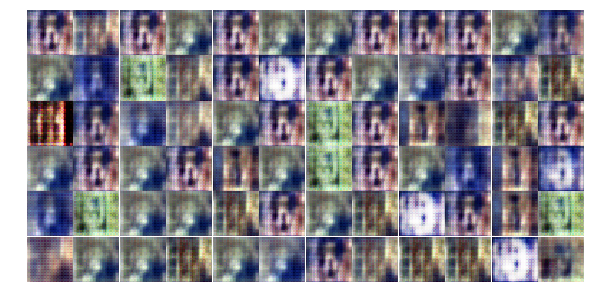

Epoch 4/10 Qfunction Loss:7.3473 Generator Loss:3.2398 Discriminator Loss:1.0437
Epoch 4/10 Qfunction Loss:8.3006 Generator Loss:3.3334 Discriminator Loss:0.8546
Epoch 4/10 Qfunction Loss:7.1103 Generator Loss:3.2459 Discriminator Loss:0.8290
Epoch 4/10 Qfunction Loss:4.8200 Generator Loss:3.1369 Discriminator Loss:0.8912
Epoch 4/10 Qfunction Loss:6.2674 Generator Loss:3.1355 Discriminator Loss:0.8844
Epoch 4/10 Qfunction Loss:6.8014 Generator Loss:3.6532 Discriminator Loss:0.6332
Epoch 4/10 Qfunction Loss:9.9070 Generator Loss:3.6191 Discriminator Loss:1.0150
Epoch 4/10 Qfunction Loss:8.0922 Generator Loss:3.9949 Discriminator Loss:0.8250
Epoch 4/10 Qfunction Loss:5.8939 Generator Loss:3.4561 Discriminator Loss:0.8244
Epoch 4/10 Qfunction Loss:6.8190 Generator Loss:3.1090 Discriminator Loss:1.0023


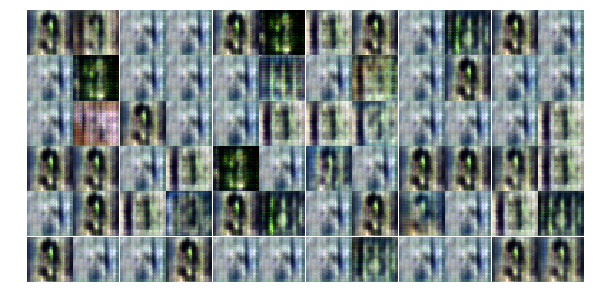

Epoch 4/10 Qfunction Loss:5.1936 Generator Loss:3.2374 Discriminator Loss:0.7848
Epoch 4/10 Qfunction Loss:7.1854 Generator Loss:3.0068 Discriminator Loss:0.9056
Epoch 4/10 Qfunction Loss:5.7871 Generator Loss:3.3428 Discriminator Loss:0.8970
Epoch 4/10 Qfunction Loss:7.9548 Generator Loss:3.0475 Discriminator Loss:1.1512
Epoch 4/10 Qfunction Loss:8.3520 Generator Loss:3.4598 Discriminator Loss:0.6917
Epoch 4/10 Qfunction Loss:5.7808 Generator Loss:3.7002 Discriminator Loss:0.8007
Epoch 4/10 Qfunction Loss:5.2741 Generator Loss:3.2271 Discriminator Loss:1.0039
Epoch 4/10 Qfunction Loss:6.6523 Generator Loss:3.6909 Discriminator Loss:0.7476
Epoch 4/10 Qfunction Loss:4.7046 Generator Loss:3.1683 Discriminator Loss:0.8452
Epoch 5/10 Qfunction Loss:8.9899 Generator Loss:3.4587 Discriminator Loss:0.7642


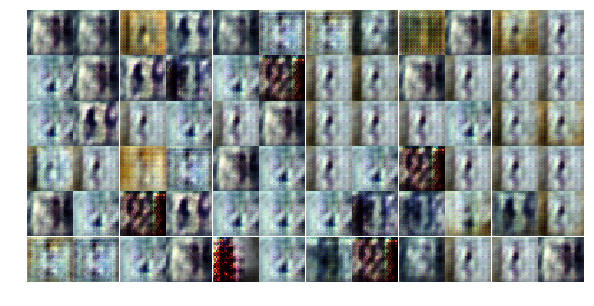

Epoch 5/10 Qfunction Loss:6.6635 Generator Loss:4.1657 Discriminator Loss:0.8863
Epoch 5/10 Qfunction Loss:8.3595 Generator Loss:3.8617 Discriminator Loss:1.5021
Epoch 5/10 Qfunction Loss:5.3661 Generator Loss:3.5927 Discriminator Loss:0.7310
Epoch 5/10 Qfunction Loss:8.6375 Generator Loss:3.0640 Discriminator Loss:0.8666
Epoch 5/10 Qfunction Loss:6.2549 Generator Loss:3.1482 Discriminator Loss:0.9003
Epoch 5/10 Qfunction Loss:6.8354 Generator Loss:3.1735 Discriminator Loss:0.8301
Epoch 5/10 Qfunction Loss:4.5496 Generator Loss:3.2015 Discriminator Loss:1.0599
Epoch 5/10 Qfunction Loss:9.1152 Generator Loss:2.8763 Discriminator Loss:1.1702
Epoch 5/10 Qfunction Loss:4.9797 Generator Loss:3.1285 Discriminator Loss:0.9058
Epoch 5/10 Qfunction Loss:5.8739 Generator Loss:3.1768 Discriminator Loss:0.8175


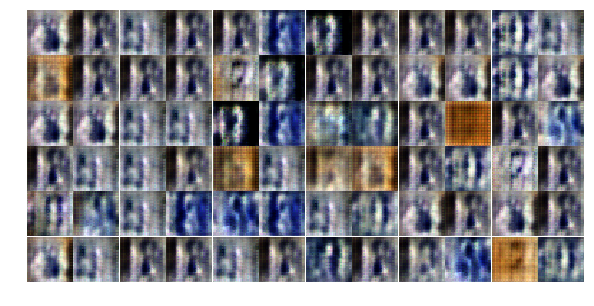

Epoch 5/10 Qfunction Loss:6.9098 Generator Loss:3.5988 Discriminator Loss:0.6978
Epoch 5/10 Qfunction Loss:6.5850 Generator Loss:3.7195 Discriminator Loss:0.6484
Epoch 5/10 Qfunction Loss:9.2983 Generator Loss:4.9304 Discriminator Loss:1.1866
Epoch 5/10 Qfunction Loss:5.6433 Generator Loss:3.8800 Discriminator Loss:0.9508
Epoch 5/10 Qfunction Loss:6.6250 Generator Loss:3.3604 Discriminator Loss:0.7962
Epoch 5/10 Qfunction Loss:7.1947 Generator Loss:3.9443 Discriminator Loss:0.5708
Epoch 5/10 Qfunction Loss:6.5318 Generator Loss:3.6779 Discriminator Loss:0.6520
Epoch 5/10 Qfunction Loss:11.1661 Generator Loss:5.3386 Discriminator Loss:2.6325
Epoch 5/10 Qfunction Loss:7.9444 Generator Loss:2.9565 Discriminator Loss:1.0643
Epoch 5/10 Qfunction Loss:8.1519 Generator Loss:3.0745 Discriminator Loss:0.9352


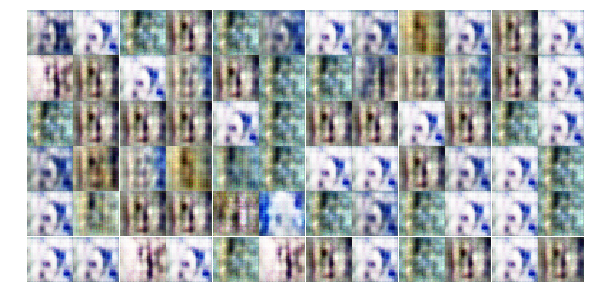

Epoch 5/10 Qfunction Loss:11.6829 Generator Loss:4.6438 Discriminator Loss:0.5212
Epoch 5/10 Qfunction Loss:9.6199 Generator Loss:3.7021 Discriminator Loss:1.2620
Epoch 5/10 Qfunction Loss:13.7596 Generator Loss:3.7099 Discriminator Loss:0.8306
Epoch 5/10 Qfunction Loss:5.8846 Generator Loss:3.0639 Discriminator Loss:0.9159
Epoch 5/10 Qfunction Loss:7.6641 Generator Loss:3.1303 Discriminator Loss:0.9192
Epoch 5/10 Qfunction Loss:7.3651 Generator Loss:3.5160 Discriminator Loss:0.8701
Epoch 5/10 Qfunction Loss:10.2449 Generator Loss:3.4185 Discriminator Loss:0.6788
Epoch 5/10 Qfunction Loss:7.0058 Generator Loss:3.5482 Discriminator Loss:0.6750
Epoch 5/10 Qfunction Loss:6.9793 Generator Loss:3.9471 Discriminator Loss:0.5814
Epoch 5/10 Qfunction Loss:8.6703 Generator Loss:4.4446 Discriminator Loss:1.2438


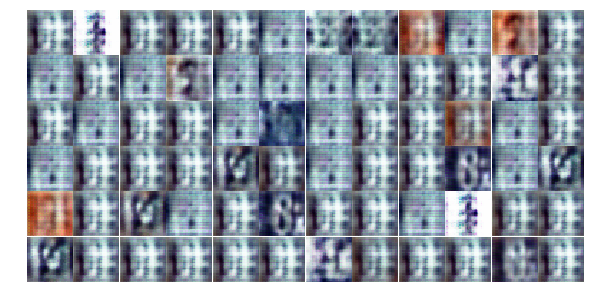

Epoch 5/10 Qfunction Loss:7.7497 Generator Loss:4.3894 Discriminator Loss:0.6425
Epoch 5/10 Qfunction Loss:4.8566 Generator Loss:3.6294 Discriminator Loss:1.1288
Epoch 5/10 Qfunction Loss:5.0763 Generator Loss:3.8041 Discriminator Loss:0.5831
Epoch 5/10 Qfunction Loss:9.7469 Generator Loss:4.6858 Discriminator Loss:1.2887
Epoch 5/10 Qfunction Loss:5.9078 Generator Loss:3.8679 Discriminator Loss:1.3493
Epoch 5/10 Qfunction Loss:6.3386 Generator Loss:3.8384 Discriminator Loss:0.6515
Epoch 5/10 Qfunction Loss:7.2581 Generator Loss:3.8061 Discriminator Loss:0.7235
Epoch 5/10 Qfunction Loss:9.1478 Generator Loss:3.5887 Discriminator Loss:0.7150
Epoch 5/10 Qfunction Loss:9.0865 Generator Loss:3.2717 Discriminator Loss:0.9041
Epoch 5/10 Qfunction Loss:11.8108 Generator Loss:3.6517 Discriminator Loss:0.6970


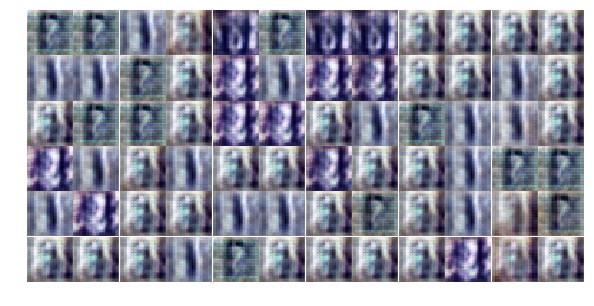

Epoch 5/10 Qfunction Loss:8.5065 Generator Loss:3.8505 Discriminator Loss:0.6516
Epoch 5/10 Qfunction Loss:7.3801 Generator Loss:3.7561 Discriminator Loss:0.8100
Epoch 5/10 Qfunction Loss:10.3244 Generator Loss:3.3089 Discriminator Loss:0.8161
Epoch 5/10 Qfunction Loss:11.0320 Generator Loss:4.1220 Discriminator Loss:1.1753
Epoch 5/10 Qfunction Loss:6.2080 Generator Loss:3.7174 Discriminator Loss:0.8621
Epoch 5/10 Qfunction Loss:9.2700 Generator Loss:4.1074 Discriminator Loss:0.5503
Epoch 5/10 Qfunction Loss:8.0390 Generator Loss:3.6193 Discriminator Loss:0.6855
Epoch 5/10 Qfunction Loss:5.4985 Generator Loss:3.7532 Discriminator Loss:0.7517
Epoch 5/10 Qfunction Loss:6.0989 Generator Loss:3.7631 Discriminator Loss:0.6514
Epoch 5/10 Qfunction Loss:7.6690 Generator Loss:4.3237 Discriminator Loss:0.6470


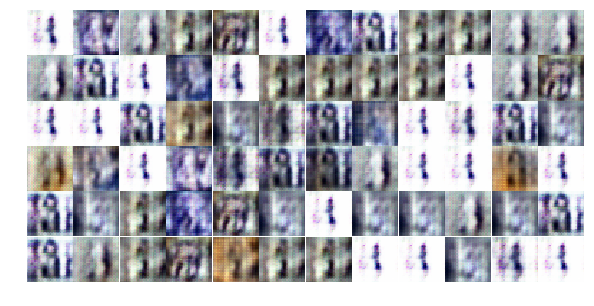

Epoch 5/10 Qfunction Loss:5.5618 Generator Loss:3.3802 Discriminator Loss:0.8581
Epoch 5/10 Qfunction Loss:5.7014 Generator Loss:3.6930 Discriminator Loss:0.8921
Epoch 5/10 Qfunction Loss:9.1454 Generator Loss:4.5903 Discriminator Loss:0.9438
Epoch 5/10 Qfunction Loss:6.9588 Generator Loss:4.4101 Discriminator Loss:0.6180
Epoch 5/10 Qfunction Loss:9.9778 Generator Loss:3.6069 Discriminator Loss:0.7533
Epoch 5/10 Qfunction Loss:9.3518 Generator Loss:4.1596 Discriminator Loss:0.5334
Epoch 6/10 Qfunction Loss:7.1960 Generator Loss:4.1887 Discriminator Loss:1.2597
Epoch 6/10 Qfunction Loss:7.3586 Generator Loss:3.9698 Discriminator Loss:0.6657
Epoch 6/10 Qfunction Loss:9.5918 Generator Loss:5.0605 Discriminator Loss:1.5342
Epoch 6/10 Qfunction Loss:9.4598 Generator Loss:3.4022 Discriminator Loss:0.8173


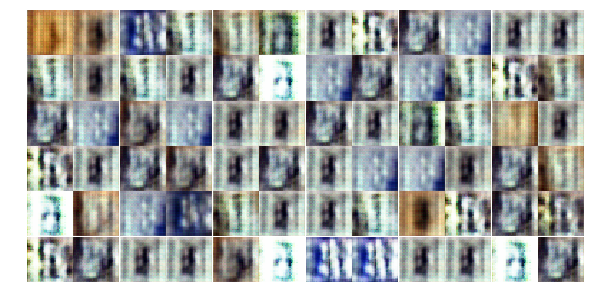

Epoch 6/10 Qfunction Loss:9.3117 Generator Loss:4.1254 Discriminator Loss:0.5058
Epoch 6/10 Qfunction Loss:7.4648 Generator Loss:4.0366 Discriminator Loss:0.7550
Epoch 6/10 Qfunction Loss:11.3913 Generator Loss:5.1309 Discriminator Loss:0.4242
Epoch 6/10 Qfunction Loss:10.8947 Generator Loss:5.8200 Discriminator Loss:0.2127
Epoch 6/10 Qfunction Loss:10.4962 Generator Loss:3.8273 Discriminator Loss:0.6459
Epoch 6/10 Qfunction Loss:7.1577 Generator Loss:3.8555 Discriminator Loss:0.6161
Epoch 6/10 Qfunction Loss:8.9108 Generator Loss:3.9709 Discriminator Loss:0.5956
Epoch 6/10 Qfunction Loss:7.0149 Generator Loss:3.6573 Discriminator Loss:0.9621
Epoch 6/10 Qfunction Loss:6.7391 Generator Loss:3.4248 Discriminator Loss:0.9698
Epoch 6/10 Qfunction Loss:16.7094 Generator Loss:4.3494 Discriminator Loss:0.4438


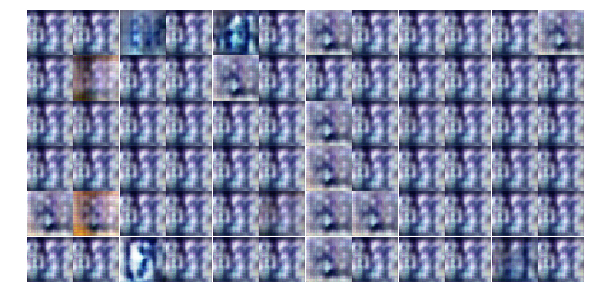

Epoch 6/10 Qfunction Loss:7.4595 Generator Loss:3.6063 Discriminator Loss:0.7230
Epoch 6/10 Qfunction Loss:7.1911 Generator Loss:3.2538 Discriminator Loss:0.9694
Epoch 6/10 Qfunction Loss:10.5998 Generator Loss:4.0365 Discriminator Loss:0.8899
Epoch 6/10 Qfunction Loss:7.0367 Generator Loss:4.0393 Discriminator Loss:0.6043
Epoch 6/10 Qfunction Loss:15.4237 Generator Loss:4.9692 Discriminator Loss:0.4926
Epoch 6/10 Qfunction Loss:10.8409 Generator Loss:4.7930 Discriminator Loss:0.4983
Epoch 6/10 Qfunction Loss:10.9460 Generator Loss:4.9999 Discriminator Loss:0.8479
Epoch 6/10 Qfunction Loss:14.5832 Generator Loss:5.9127 Discriminator Loss:0.4407
Epoch 6/10 Qfunction Loss:7.6477 Generator Loss:4.7302 Discriminator Loss:1.2239
Epoch 6/10 Qfunction Loss:8.1934 Generator Loss:3.3273 Discriminator Loss:0.7909


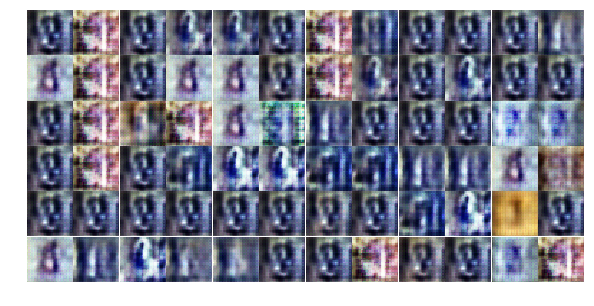

Epoch 6/10 Qfunction Loss:8.4716 Generator Loss:4.0151 Discriminator Loss:0.7690
Epoch 6/10 Qfunction Loss:5.8081 Generator Loss:3.5484 Discriminator Loss:0.7189
Epoch 6/10 Qfunction Loss:10.1717 Generator Loss:4.6597 Discriminator Loss:0.5421
Epoch 6/10 Qfunction Loss:6.9463 Generator Loss:4.1153 Discriminator Loss:0.6935
Epoch 6/10 Qfunction Loss:5.6946 Generator Loss:3.9334 Discriminator Loss:0.6469
Epoch 6/10 Qfunction Loss:14.7785 Generator Loss:3.9506 Discriminator Loss:0.9087
Epoch 6/10 Qfunction Loss:7.0509 Generator Loss:3.6394 Discriminator Loss:0.8071
Epoch 6/10 Qfunction Loss:10.0688 Generator Loss:4.1257 Discriminator Loss:0.5645
Epoch 6/10 Qfunction Loss:15.2871 Generator Loss:5.2593 Discriminator Loss:0.5776
Epoch 6/10 Qfunction Loss:11.1041 Generator Loss:4.7000 Discriminator Loss:0.6305


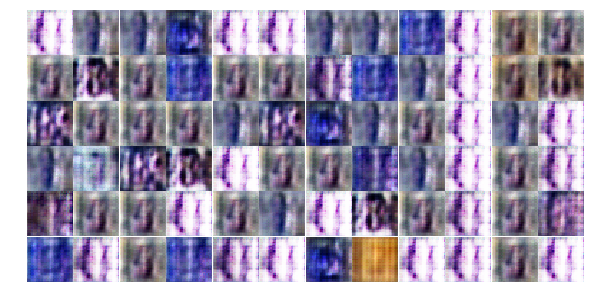

Epoch 6/10 Qfunction Loss:7.4100 Generator Loss:4.2877 Discriminator Loss:0.5182
Epoch 6/10 Qfunction Loss:7.5012 Generator Loss:4.8418 Discriminator Loss:0.9578
Epoch 6/10 Qfunction Loss:7.9390 Generator Loss:3.7761 Discriminator Loss:0.7193
Epoch 6/10 Qfunction Loss:10.2764 Generator Loss:3.9986 Discriminator Loss:0.5808
Epoch 6/10 Qfunction Loss:9.8344 Generator Loss:4.4134 Discriminator Loss:0.4861
Epoch 6/10 Qfunction Loss:6.4182 Generator Loss:4.6226 Discriminator Loss:0.4889
Epoch 6/10 Qfunction Loss:13.6714 Generator Loss:4.2861 Discriminator Loss:0.5514
Epoch 6/10 Qfunction Loss:16.1953 Generator Loss:4.3529 Discriminator Loss:0.5229
Epoch 6/10 Qfunction Loss:7.9386 Generator Loss:4.4812 Discriminator Loss:0.9290
Epoch 6/10 Qfunction Loss:6.7222 Generator Loss:4.8529 Discriminator Loss:0.5349


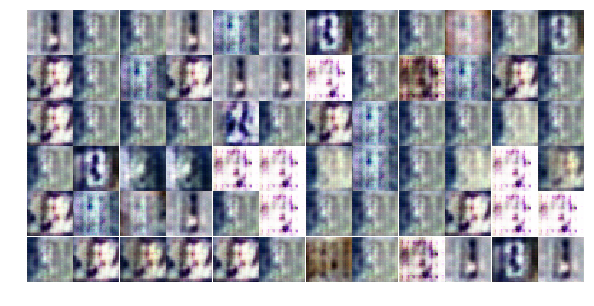

Epoch 6/10 Qfunction Loss:10.9943 Generator Loss:7.0913 Discriminator Loss:1.0779
Epoch 6/10 Qfunction Loss:8.1664 Generator Loss:5.2251 Discriminator Loss:1.5181
Epoch 6/10 Qfunction Loss:8.4744 Generator Loss:3.7228 Discriminator Loss:0.7196
Epoch 6/10 Qfunction Loss:6.6147 Generator Loss:4.2919 Discriminator Loss:0.4730
Epoch 6/10 Qfunction Loss:9.2349 Generator Loss:4.1850 Discriminator Loss:0.9527
Epoch 6/10 Qfunction Loss:7.5997 Generator Loss:4.1707 Discriminator Loss:0.6556
Epoch 6/10 Qfunction Loss:11.0642 Generator Loss:4.2867 Discriminator Loss:0.6379
Epoch 6/10 Qfunction Loss:9.9444 Generator Loss:4.3553 Discriminator Loss:0.4763
Epoch 6/10 Qfunction Loss:8.4741 Generator Loss:3.8281 Discriminator Loss:0.6524
Epoch 6/10 Qfunction Loss:8.9293 Generator Loss:4.0691 Discriminator Loss:0.6285


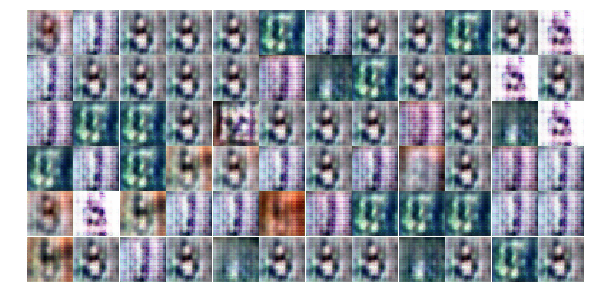

Epoch 6/10 Qfunction Loss:12.5050 Generator Loss:4.2357 Discriminator Loss:0.6035
Epoch 6/10 Qfunction Loss:10.4832 Generator Loss:4.7441 Discriminator Loss:0.4765
Epoch 6/10 Qfunction Loss:10.4094 Generator Loss:4.9587 Discriminator Loss:1.0413
Epoch 7/10 Qfunction Loss:22.1395 Generator Loss:4.6939 Discriminator Loss:0.5513
Epoch 7/10 Qfunction Loss:16.5009 Generator Loss:4.0186 Discriminator Loss:0.6620
Epoch 7/10 Qfunction Loss:11.6893 Generator Loss:5.3076 Discriminator Loss:0.7977
Epoch 7/10 Qfunction Loss:9.1036 Generator Loss:4.7370 Discriminator Loss:0.5689
Epoch 7/10 Qfunction Loss:16.8381 Generator Loss:4.4182 Discriminator Loss:0.4758
Epoch 7/10 Qfunction Loss:19.9695 Generator Loss:4.4943 Discriminator Loss:0.5551
Epoch 7/10 Qfunction Loss:8.5446 Generator Loss:4.8306 Discriminator Loss:0.7135


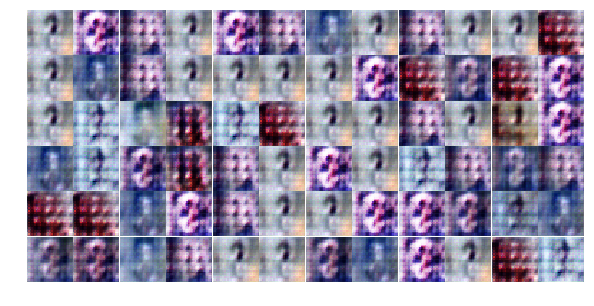

Epoch 7/10 Qfunction Loss:7.1623 Generator Loss:4.1068 Discriminator Loss:0.5657
Epoch 7/10 Qfunction Loss:6.9252 Generator Loss:4.3468 Discriminator Loss:0.5133
Epoch 7/10 Qfunction Loss:9.7759 Generator Loss:4.1604 Discriminator Loss:0.5887
Epoch 7/10 Qfunction Loss:9.5782 Generator Loss:4.2188 Discriminator Loss:0.6035
Epoch 7/10 Qfunction Loss:11.7696 Generator Loss:5.4929 Discriminator Loss:1.1171
Epoch 7/10 Qfunction Loss:8.8621 Generator Loss:5.0121 Discriminator Loss:0.6382
Epoch 7/10 Qfunction Loss:11.8797 Generator Loss:4.9501 Discriminator Loss:0.9234
Epoch 7/10 Qfunction Loss:9.6756 Generator Loss:4.0405 Discriminator Loss:0.6752
Epoch 7/10 Qfunction Loss:11.3730 Generator Loss:3.9718 Discriminator Loss:0.5800
Epoch 7/10 Qfunction Loss:8.4715 Generator Loss:4.7179 Discriminator Loss:0.4640


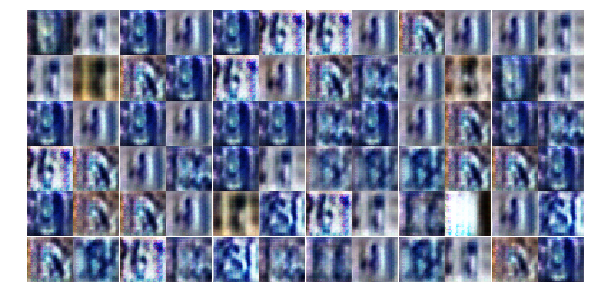

Epoch 7/10 Qfunction Loss:8.9885 Generator Loss:4.4451 Discriminator Loss:0.4855
Epoch 7/10 Qfunction Loss:19.6072 Generator Loss:4.8206 Discriminator Loss:0.3764
Epoch 7/10 Qfunction Loss:18.5775 Generator Loss:5.0948 Discriminator Loss:0.9855
Epoch 7/10 Qfunction Loss:7.6957 Generator Loss:3.9917 Discriminator Loss:0.6284
Epoch 7/10 Qfunction Loss:9.1089 Generator Loss:4.2149 Discriminator Loss:0.6220
Epoch 7/10 Qfunction Loss:10.3301 Generator Loss:5.5581 Discriminator Loss:0.4565
Epoch 7/10 Qfunction Loss:7.7748 Generator Loss:4.0977 Discriminator Loss:0.6885
Epoch 7/10 Qfunction Loss:18.5242 Generator Loss:4.4116 Discriminator Loss:0.5639
Epoch 7/10 Qfunction Loss:9.7628 Generator Loss:4.0051 Discriminator Loss:0.6383
Epoch 7/10 Qfunction Loss:9.2589 Generator Loss:3.9715 Discriminator Loss:0.5985


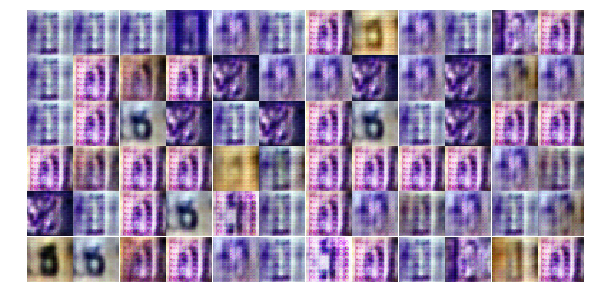

Epoch 7/10 Qfunction Loss:20.5075 Generator Loss:6.8564 Discriminator Loss:1.8349
Epoch 7/10 Qfunction Loss:10.6898 Generator Loss:4.4811 Discriminator Loss:0.6531
Epoch 7/10 Qfunction Loss:7.0140 Generator Loss:4.2955 Discriminator Loss:0.5595
Epoch 7/10 Qfunction Loss:8.2871 Generator Loss:4.3966 Discriminator Loss:0.5823
Epoch 7/10 Qfunction Loss:17.1955 Generator Loss:4.2913 Discriminator Loss:0.7753
Epoch 7/10 Qfunction Loss:8.4002 Generator Loss:5.1835 Discriminator Loss:0.3812
Epoch 7/10 Qfunction Loss:16.3341 Generator Loss:6.4488 Discriminator Loss:1.4403
Epoch 7/10 Qfunction Loss:17.0031 Generator Loss:4.2953 Discriminator Loss:0.8128
Epoch 7/10 Qfunction Loss:8.9673 Generator Loss:4.9256 Discriminator Loss:0.7582
Epoch 7/10 Qfunction Loss:12.1996 Generator Loss:4.4491 Discriminator Loss:0.4633


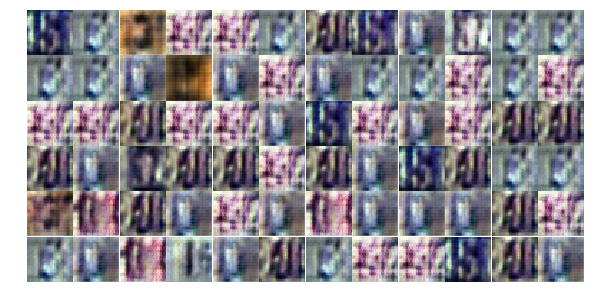

Epoch 7/10 Qfunction Loss:13.6678 Generator Loss:5.5659 Discriminator Loss:0.2484
Epoch 7/10 Qfunction Loss:14.5191 Generator Loss:6.2386 Discriminator Loss:1.2707
Epoch 7/10 Qfunction Loss:6.5444 Generator Loss:4.3752 Discriminator Loss:0.4904
Epoch 7/10 Qfunction Loss:12.0124 Generator Loss:4.6514 Discriminator Loss:0.5776
Epoch 7/10 Qfunction Loss:6.7064 Generator Loss:5.0121 Discriminator Loss:0.5356
Epoch 7/10 Qfunction Loss:8.2668 Generator Loss:3.6560 Discriminator Loss:0.7189
Epoch 7/10 Qfunction Loss:8.2691 Generator Loss:5.3012 Discriminator Loss:0.4607
Epoch 7/10 Qfunction Loss:16.4475 Generator Loss:5.9978 Discriminator Loss:0.4562
Epoch 7/10 Qfunction Loss:9.2131 Generator Loss:5.4291 Discriminator Loss:0.3372
Epoch 7/10 Qfunction Loss:13.9219 Generator Loss:4.6536 Discriminator Loss:0.6428


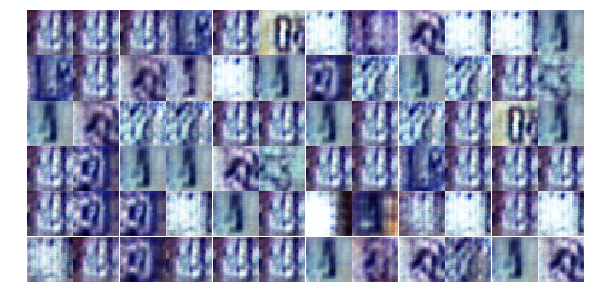

Epoch 7/10 Qfunction Loss:9.7157 Generator Loss:4.5770 Discriminator Loss:0.6424
Epoch 7/10 Qfunction Loss:7.4342 Generator Loss:4.1217 Discriminator Loss:0.7209
Epoch 7/10 Qfunction Loss:7.4646 Generator Loss:5.0153 Discriminator Loss:0.4994
Epoch 7/10 Qfunction Loss:12.2429 Generator Loss:4.6147 Discriminator Loss:0.8186
Epoch 7/10 Qfunction Loss:19.4697 Generator Loss:5.4374 Discriminator Loss:0.5076
Epoch 7/10 Qfunction Loss:11.8543 Generator Loss:5.9086 Discriminator Loss:0.2315
Epoch 7/10 Qfunction Loss:11.7423 Generator Loss:4.6613 Discriminator Loss:0.4555
Epoch 7/10 Qfunction Loss:11.3138 Generator Loss:4.9053 Discriminator Loss:0.4234
Epoch 7/10 Qfunction Loss:5.9502 Generator Loss:4.6907 Discriminator Loss:0.5188
Epoch 7/10 Qfunction Loss:6.9062 Generator Loss:4.5584 Discriminator Loss:0.7406


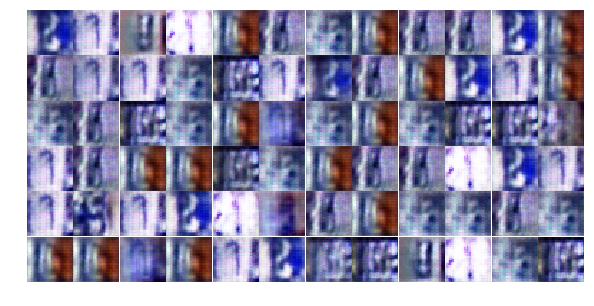

Epoch 7/10 Qfunction Loss:9.7186 Generator Loss:4.5522 Discriminator Loss:0.5077
Epoch 8/10 Qfunction Loss:13.1595 Generator Loss:5.9231 Discriminator Loss:1.0662
Epoch 8/10 Qfunction Loss:59.1272 Generator Loss:9.2151 Discriminator Loss:0.1497
Epoch 8/10 Qfunction Loss:22.8887 Generator Loss:8.4844 Discriminator Loss:0.9967
Epoch 8/10 Qfunction Loss:8.1779 Generator Loss:4.9335 Discriminator Loss:0.5122
Epoch 8/10 Qfunction Loss:10.2996 Generator Loss:5.2314 Discriminator Loss:0.6103
Epoch 8/10 Qfunction Loss:20.7461 Generator Loss:6.6081 Discriminator Loss:0.2345
Epoch 8/10 Qfunction Loss:10.9209 Generator Loss:4.6286 Discriminator Loss:0.4506
Epoch 8/10 Qfunction Loss:10.8167 Generator Loss:4.9744 Discriminator Loss:0.3825
Epoch 8/10 Qfunction Loss:9.4400 Generator Loss:5.3898 Discriminator Loss:0.6843


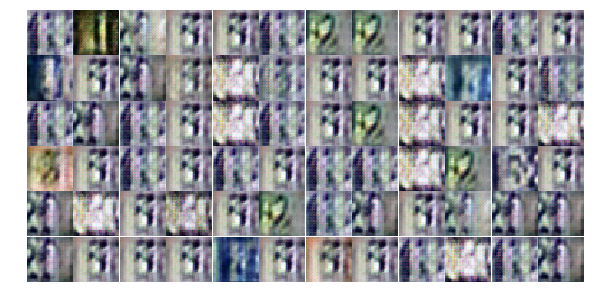

Epoch 8/10 Qfunction Loss:18.7272 Generator Loss:4.3105 Discriminator Loss:0.6485
Epoch 8/10 Qfunction Loss:9.9802 Generator Loss:5.8796 Discriminator Loss:0.6750
Epoch 8/10 Qfunction Loss:13.8684 Generator Loss:5.6006 Discriminator Loss:0.6017
Epoch 8/10 Qfunction Loss:10.6365 Generator Loss:5.1739 Discriminator Loss:0.6700
Epoch 8/10 Qfunction Loss:15.4437 Generator Loss:5.8881 Discriminator Loss:0.3967
Epoch 8/10 Qfunction Loss:17.1113 Generator Loss:4.8871 Discriminator Loss:0.5484
Epoch 8/10 Qfunction Loss:10.4920 Generator Loss:5.4193 Discriminator Loss:0.6020
Epoch 8/10 Qfunction Loss:11.3280 Generator Loss:4.9152 Discriminator Loss:0.4698
Epoch 8/10 Qfunction Loss:7.8853 Generator Loss:4.7134 Discriminator Loss:0.5599
Epoch 8/10 Qfunction Loss:9.9863 Generator Loss:4.8361 Discriminator Loss:1.0765


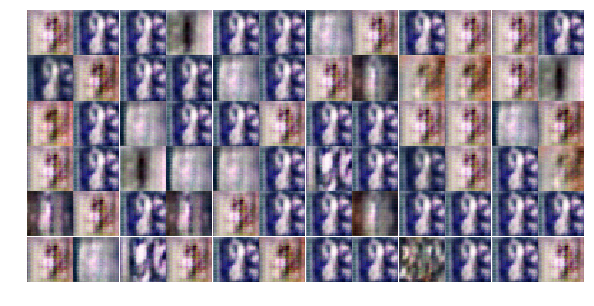

Epoch 8/10 Qfunction Loss:10.7894 Generator Loss:5.2214 Discriminator Loss:0.3124
Epoch 8/10 Qfunction Loss:16.5897 Generator Loss:5.4082 Discriminator Loss:0.4390
Epoch 8/10 Qfunction Loss:11.7631 Generator Loss:5.1118 Discriminator Loss:0.4614
Epoch 8/10 Qfunction Loss:11.3073 Generator Loss:5.9023 Discriminator Loss:0.3113
Epoch 8/10 Qfunction Loss:18.5501 Generator Loss:5.9797 Discriminator Loss:0.3378
Epoch 8/10 Qfunction Loss:21.2297 Generator Loss:5.4766 Discriminator Loss:0.3650
Epoch 8/10 Qfunction Loss:9.1033 Generator Loss:4.6896 Discriminator Loss:1.0504
Epoch 8/10 Qfunction Loss:8.1668 Generator Loss:5.9417 Discriminator Loss:0.2521
Epoch 8/10 Qfunction Loss:10.5932 Generator Loss:5.7979 Discriminator Loss:0.3730
Epoch 8/10 Qfunction Loss:9.2439 Generator Loss:5.2571 Discriminator Loss:0.4317


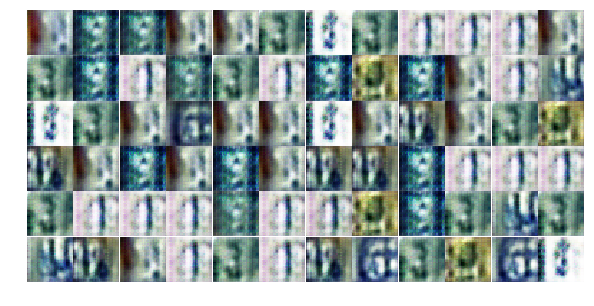

Epoch 8/10 Qfunction Loss:10.8500 Generator Loss:5.7206 Discriminator Loss:0.6147
Epoch 8/10 Qfunction Loss:10.5487 Generator Loss:5.3859 Discriminator Loss:0.3808
Epoch 8/10 Qfunction Loss:18.3941 Generator Loss:6.4404 Discriminator Loss:0.5533
Epoch 8/10 Qfunction Loss:12.8751 Generator Loss:6.2659 Discriminator Loss:0.8927
Epoch 8/10 Qfunction Loss:23.7521 Generator Loss:6.5109 Discriminator Loss:1.0497
Epoch 8/10 Qfunction Loss:9.5756 Generator Loss:5.1506 Discriminator Loss:0.3779
Epoch 8/10 Qfunction Loss:12.6386 Generator Loss:6.0449 Discriminator Loss:1.2451
Epoch 8/10 Qfunction Loss:9.0986 Generator Loss:5.0640 Discriminator Loss:0.4144
Epoch 8/10 Qfunction Loss:17.0149 Generator Loss:7.1116 Discriminator Loss:0.3382
Epoch 8/10 Qfunction Loss:16.4128 Generator Loss:5.3585 Discriminator Loss:0.3551


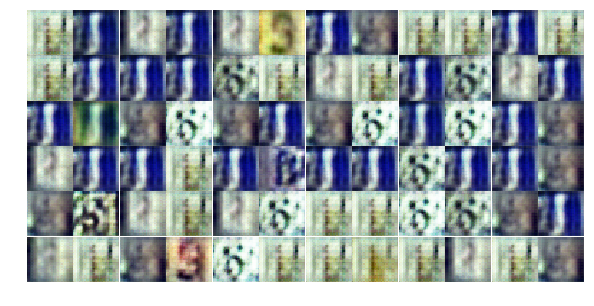

Epoch 8/10 Qfunction Loss:10.5288 Generator Loss:7.2719 Discriminator Loss:0.4745
Epoch 8/10 Qfunction Loss:10.3017 Generator Loss:5.2623 Discriminator Loss:0.5190
Epoch 8/10 Qfunction Loss:9.3064 Generator Loss:5.2041 Discriminator Loss:0.8384
Epoch 8/10 Qfunction Loss:8.0166 Generator Loss:5.6289 Discriminator Loss:0.6020
Epoch 8/10 Qfunction Loss:7.3240 Generator Loss:5.2573 Discriminator Loss:0.5166
Epoch 8/10 Qfunction Loss:24.0447 Generator Loss:6.7750 Discriminator Loss:0.2490
Epoch 8/10 Qfunction Loss:13.1728 Generator Loss:6.2817 Discriminator Loss:0.1988
Epoch 8/10 Qfunction Loss:17.6828 Generator Loss:6.1084 Discriminator Loss:0.3942
Epoch 8/10 Qfunction Loss:7.0892 Generator Loss:4.9458 Discriminator Loss:0.4581
Epoch 8/10 Qfunction Loss:8.5294 Generator Loss:5.0911 Discriminator Loss:0.3621


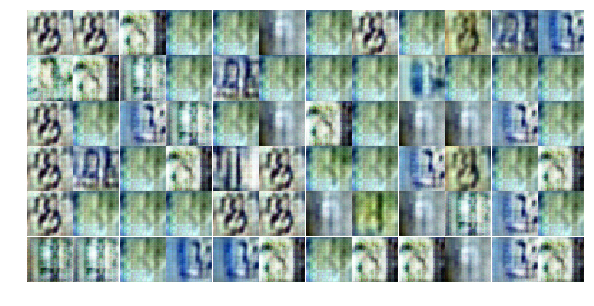

Epoch 8/10 Qfunction Loss:13.2005 Generator Loss:6.2470 Discriminator Loss:0.2160
Epoch 8/10 Qfunction Loss:17.8828 Generator Loss:7.1559 Discriminator Loss:0.7536
Epoch 8/10 Qfunction Loss:7.3150 Generator Loss:5.1402 Discriminator Loss:0.5889
Epoch 8/10 Qfunction Loss:10.2366 Generator Loss:4.8424 Discriminator Loss:0.5268
Epoch 8/10 Qfunction Loss:9.3721 Generator Loss:5.1781 Discriminator Loss:0.7290
Epoch 8/10 Qfunction Loss:15.1454 Generator Loss:6.1501 Discriminator Loss:1.2467
Epoch 8/10 Qfunction Loss:16.5578 Generator Loss:6.0297 Discriminator Loss:0.2165
Epoch 8/10 Qfunction Loss:15.1737 Generator Loss:6.0231 Discriminator Loss:0.9556
Epoch 9/10 Qfunction Loss:8.6710 Generator Loss:5.5903 Discriminator Loss:0.6699
Epoch 9/10 Qfunction Loss:12.5484 Generator Loss:5.7138 Discriminator Loss:0.3726


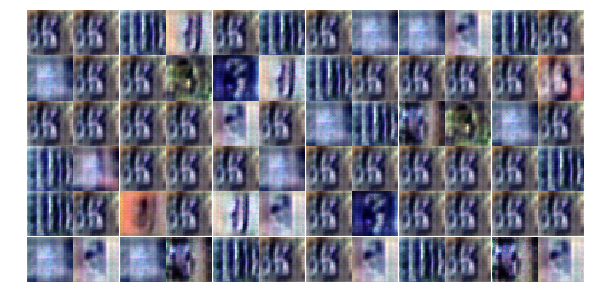

Epoch 9/10 Qfunction Loss:14.5676 Generator Loss:7.2780 Discriminator Loss:1.2546
Epoch 9/10 Qfunction Loss:9.0118 Generator Loss:5.6488 Discriminator Loss:0.3958
Epoch 9/10 Qfunction Loss:8.6970 Generator Loss:5.8113 Discriminator Loss:0.3066
Epoch 9/10 Qfunction Loss:15.1711 Generator Loss:6.3533 Discriminator Loss:0.4726
Epoch 9/10 Qfunction Loss:8.3902 Generator Loss:5.8426 Discriminator Loss:1.2323
Epoch 9/10 Qfunction Loss:11.3571 Generator Loss:4.3958 Discriminator Loss:0.7755
Epoch 9/10 Qfunction Loss:9.1821 Generator Loss:4.8391 Discriminator Loss:0.4930
Epoch 9/10 Qfunction Loss:13.9749 Generator Loss:5.5164 Discriminator Loss:0.9570
Epoch 9/10 Qfunction Loss:18.7095 Generator Loss:5.6344 Discriminator Loss:0.6945
Epoch 9/10 Qfunction Loss:10.9785 Generator Loss:5.4059 Discriminator Loss:0.4289


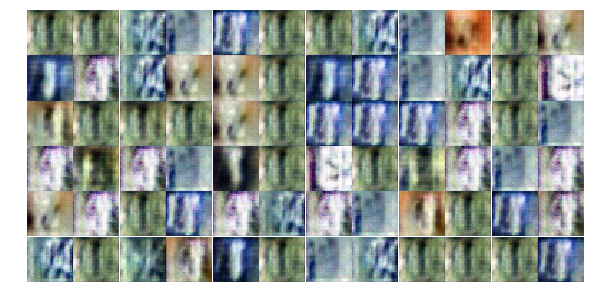

Epoch 9/10 Qfunction Loss:15.3543 Generator Loss:6.3625 Discriminator Loss:0.2745
Epoch 9/10 Qfunction Loss:8.7110 Generator Loss:5.4618 Discriminator Loss:0.4937
Epoch 9/10 Qfunction Loss:10.2227 Generator Loss:5.5060 Discriminator Loss:0.5141
Epoch 9/10 Qfunction Loss:44.4034 Generator Loss:8.0176 Discriminator Loss:0.1354
Epoch 9/10 Qfunction Loss:12.1828 Generator Loss:5.1347 Discriminator Loss:0.8782
Epoch 9/10 Qfunction Loss:13.6288 Generator Loss:6.0585 Discriminator Loss:0.2749
Epoch 9/10 Qfunction Loss:19.5276 Generator Loss:5.6834 Discriminator Loss:0.4734
Epoch 9/10 Qfunction Loss:27.1182 Generator Loss:5.9632 Discriminator Loss:0.4567
Epoch 9/10 Qfunction Loss:8.5207 Generator Loss:5.4320 Discriminator Loss:0.3822
Epoch 9/10 Qfunction Loss:11.0534 Generator Loss:5.5120 Discriminator Loss:0.3009


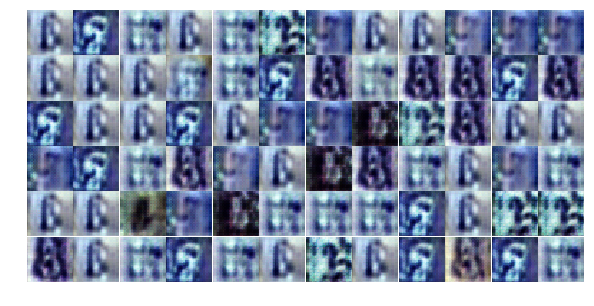

Epoch 9/10 Qfunction Loss:10.0944 Generator Loss:5.7337 Discriminator Loss:0.3196
Epoch 9/10 Qfunction Loss:9.9155 Generator Loss:5.6668 Discriminator Loss:0.7847
Epoch 9/10 Qfunction Loss:9.2224 Generator Loss:5.2030 Discriminator Loss:0.5191
Epoch 9/10 Qfunction Loss:14.5073 Generator Loss:6.6127 Discriminator Loss:0.3390
Epoch 9/10 Qfunction Loss:13.4442 Generator Loss:6.5060 Discriminator Loss:0.6311
Epoch 9/10 Qfunction Loss:13.1210 Generator Loss:6.2742 Discriminator Loss:0.3544
Epoch 9/10 Qfunction Loss:7.3435 Generator Loss:6.0628 Discriminator Loss:0.3507
Epoch 9/10 Qfunction Loss:12.2263 Generator Loss:5.7779 Discriminator Loss:0.3259
Epoch 9/10 Qfunction Loss:16.1497 Generator Loss:6.0785 Discriminator Loss:0.3147
Epoch 9/10 Qfunction Loss:9.2900 Generator Loss:6.1059 Discriminator Loss:0.2646


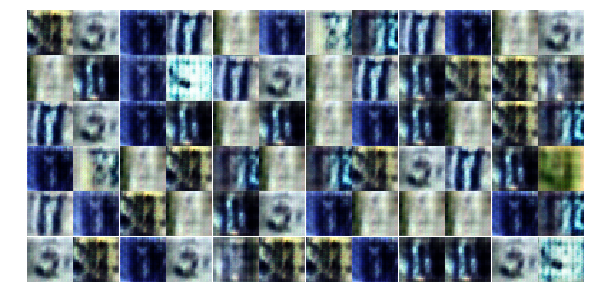

Epoch 9/10 Qfunction Loss:20.2621 Generator Loss:9.1036 Discriminator Loss:1.0595
Epoch 9/10 Qfunction Loss:23.4074 Generator Loss:6.5345 Discriminator Loss:0.2086
Epoch 9/10 Qfunction Loss:12.9223 Generator Loss:6.5162 Discriminator Loss:0.8428
Epoch 9/10 Qfunction Loss:8.8202 Generator Loss:6.0792 Discriminator Loss:0.9451
Epoch 9/10 Qfunction Loss:13.6807 Generator Loss:5.6370 Discriminator Loss:0.3697
Epoch 9/10 Qfunction Loss:14.6456 Generator Loss:5.7124 Discriminator Loss:0.3697
Epoch 9/10 Qfunction Loss:12.0809 Generator Loss:5.7911 Discriminator Loss:0.2897
Epoch 9/10 Qfunction Loss:12.3862 Generator Loss:6.4510 Discriminator Loss:0.2840
Epoch 9/10 Qfunction Loss:10.4604 Generator Loss:6.0882 Discriminator Loss:0.6791
Epoch 9/10 Qfunction Loss:16.6783 Generator Loss:5.5328 Discriminator Loss:0.4368


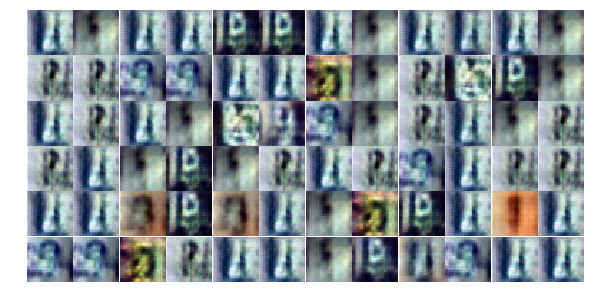

Epoch 9/10 Qfunction Loss:8.7849 Generator Loss:5.6993 Discriminator Loss:0.3669
Epoch 9/10 Qfunction Loss:13.8858 Generator Loss:5.5494 Discriminator Loss:0.4307
Epoch 9/10 Qfunction Loss:20.9621 Generator Loss:6.4208 Discriminator Loss:0.2966
Epoch 9/10 Qfunction Loss:19.9625 Generator Loss:6.9220 Discriminator Loss:0.2849
Epoch 9/10 Qfunction Loss:8.9508 Generator Loss:6.1014 Discriminator Loss:0.5314
Epoch 9/10 Qfunction Loss:11.1151 Generator Loss:6.2071 Discriminator Loss:0.8790
Epoch 9/10 Qfunction Loss:11.0904 Generator Loss:4.4893 Discriminator Loss:0.5950
Epoch 9/10 Qfunction Loss:7.7608 Generator Loss:5.7755 Discriminator Loss:0.3175
Epoch 9/10 Qfunction Loss:20.3888 Generator Loss:6.7107 Discriminator Loss:0.7484
Epoch 9/10 Qfunction Loss:44.9912 Generator Loss:6.4138 Discriminator Loss:0.2250


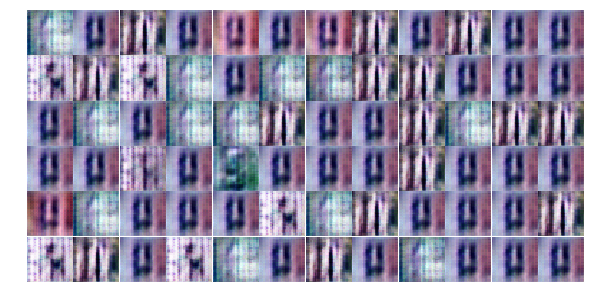

Epoch 9/10 Qfunction Loss:10.8124 Generator Loss:5.8341 Discriminator Loss:0.2968
Epoch 9/10 Qfunction Loss:12.3330 Generator Loss:6.3158 Discriminator Loss:0.2174
Epoch 9/10 Qfunction Loss:13.1719 Generator Loss:5.4623 Discriminator Loss:0.4385
Epoch 9/10 Qfunction Loss:10.2870 Generator Loss:5.9496 Discriminator Loss:0.2624
Epoch 9/10 Qfunction Loss:12.5590 Generator Loss:6.8945 Discriminator Loss:0.3434
Epoch 10/10 Qfunction Loss:15.8151 Generator Loss:7.2352 Discriminator Loss:0.3892
Epoch 10/10 Qfunction Loss:11.6196 Generator Loss:5.9513 Discriminator Loss:0.3683
Epoch 10/10 Qfunction Loss:11.7389 Generator Loss:6.5137 Discriminator Loss:0.2623
Epoch 10/10 Qfunction Loss:14.8962 Generator Loss:6.6899 Discriminator Loss:0.3324
Epoch 10/10 Qfunction Loss:18.2573 Generator Loss:5.7756 Discriminator Loss:0.3800


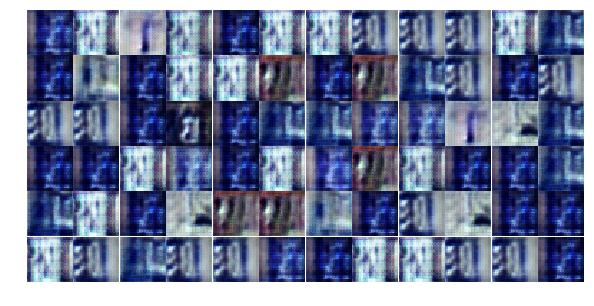

Epoch 10/10 Qfunction Loss:14.9366 Generator Loss:6.3346 Discriminator Loss:0.3013
Epoch 10/10 Qfunction Loss:12.8853 Generator Loss:5.9180 Discriminator Loss:0.2948
Epoch 10/10 Qfunction Loss:11.4412 Generator Loss:6.8775 Discriminator Loss:0.5968
Epoch 10/10 Qfunction Loss:9.2887 Generator Loss:5.4497 Discriminator Loss:0.4453
Epoch 10/10 Qfunction Loss:10.5673 Generator Loss:5.6934 Discriminator Loss:0.4310
Epoch 10/10 Qfunction Loss:18.4887 Generator Loss:8.0045 Discriminator Loss:1.0229
Epoch 10/10 Qfunction Loss:13.1947 Generator Loss:6.4145 Discriminator Loss:0.2606
Epoch 10/10 Qfunction Loss:14.6807 Generator Loss:6.6233 Discriminator Loss:0.2805
Epoch 10/10 Qfunction Loss:19.5749 Generator Loss:6.5775 Discriminator Loss:0.2733
Epoch 10/10 Qfunction Loss:17.5278 Generator Loss:6.2618 Discriminator Loss:0.2794


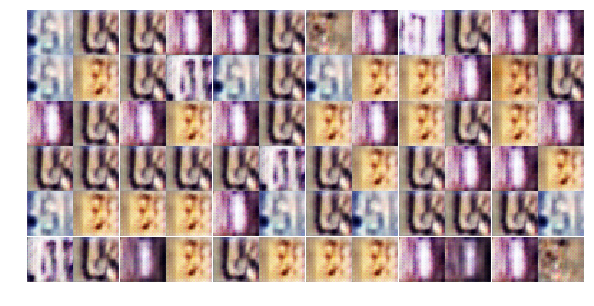

Epoch 10/10 Qfunction Loss:32.2280 Generator Loss:7.5737 Discriminator Loss:0.2114
Epoch 10/10 Qfunction Loss:14.9757 Generator Loss:6.5839 Discriminator Loss:0.6885
Epoch 10/10 Qfunction Loss:11.7665 Generator Loss:5.3368 Discriminator Loss:0.4990
Epoch 10/10 Qfunction Loss:12.2640 Generator Loss:5.9033 Discriminator Loss:0.3028
Epoch 10/10 Qfunction Loss:19.8276 Generator Loss:6.7908 Discriminator Loss:0.2950
Epoch 10/10 Qfunction Loss:12.3094 Generator Loss:6.2288 Discriminator Loss:0.3451
Epoch 10/10 Qfunction Loss:15.7874 Generator Loss:5.9494 Discriminator Loss:0.3099
Epoch 10/10 Qfunction Loss:21.4191 Generator Loss:6.1648 Discriminator Loss:0.2578
Epoch 10/10 Qfunction Loss:16.3825 Generator Loss:6.8101 Discriminator Loss:0.2052
Epoch 10/10 Qfunction Loss:12.4652 Generator Loss:6.0919 Discriminator Loss:0.4102


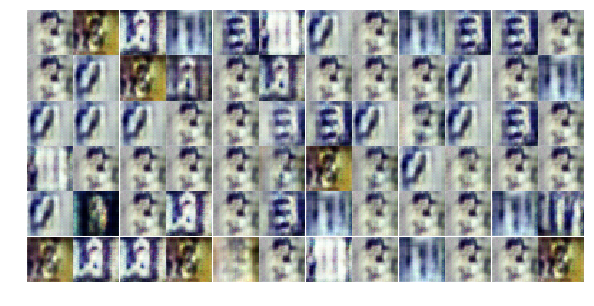

Epoch 10/10 Qfunction Loss:8.5808 Generator Loss:6.5681 Discriminator Loss:0.2404
Epoch 10/10 Qfunction Loss:12.8248 Generator Loss:5.9603 Discriminator Loss:0.2882
Epoch 10/10 Qfunction Loss:13.5530 Generator Loss:5.5972 Discriminator Loss:0.5417
Epoch 10/10 Qfunction Loss:16.0546 Generator Loss:6.3752 Discriminator Loss:0.2239
Epoch 10/10 Qfunction Loss:17.2849 Generator Loss:6.1535 Discriminator Loss:0.2733
Epoch 10/10 Qfunction Loss:9.7231 Generator Loss:6.2426 Discriminator Loss:0.2877
Epoch 10/10 Qfunction Loss:9.0485 Generator Loss:5.8737 Discriminator Loss:0.3892
Epoch 10/10 Qfunction Loss:13.1097 Generator Loss:7.3157 Discriminator Loss:1.1689
Epoch 10/10 Qfunction Loss:9.0673 Generator Loss:5.6257 Discriminator Loss:0.5253
Epoch 10/10 Qfunction Loss:11.2408 Generator Loss:5.3594 Discriminator Loss:0.4470


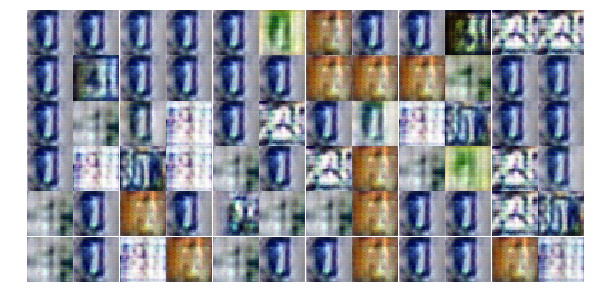

Epoch 10/10 Qfunction Loss:16.1395 Generator Loss:6.4537 Discriminator Loss:0.3145
Epoch 10/10 Qfunction Loss:10.7815 Generator Loss:6.3680 Discriminator Loss:0.5458
Epoch 10/10 Qfunction Loss:10.8006 Generator Loss:5.4800 Discriminator Loss:0.3582
Epoch 10/10 Qfunction Loss:15.9620 Generator Loss:7.6662 Discriminator Loss:0.3571
Epoch 10/10 Qfunction Loss:17.8289 Generator Loss:8.8656 Discriminator Loss:0.1309
Epoch 10/10 Qfunction Loss:17.2016 Generator Loss:6.9882 Discriminator Loss:0.6540
Epoch 10/10 Qfunction Loss:41.0107 Generator Loss:12.1315 Discriminator Loss:0.0382
Epoch 10/10 Qfunction Loss:15.7124 Generator Loss:8.7752 Discriminator Loss:0.4309
Epoch 10/10 Qfunction Loss:12.5521 Generator Loss:7.6543 Discriminator Loss:0.1552
Epoch 10/10 Qfunction Loss:28.2460 Generator Loss:6.9841 Discriminator Loss:0.2119


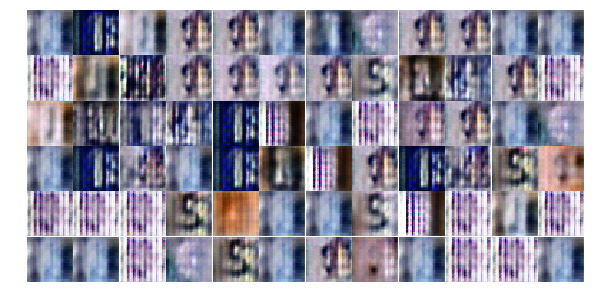

Epoch 10/10 Qfunction Loss:12.4554 Generator Loss:5.6911 Discriminator Loss:0.3340
Epoch 10/10 Qfunction Loss:9.8119 Generator Loss:5.6198 Discriminator Loss:0.3551
Epoch 10/10 Qfunction Loss:13.2034 Generator Loss:6.3409 Discriminator Loss:0.4199
Epoch 10/10 Qfunction Loss:13.2830 Generator Loss:6.5778 Discriminator Loss:0.2687
Epoch 10/10 Qfunction Loss:14.6447 Generator Loss:5.7820 Discriminator Loss:0.4212
Epoch 10/10 Qfunction Loss:9.5944 Generator Loss:6.0285 Discriminator Loss:0.3256
Epoch 10/10 Qfunction Loss:15.7231 Generator Loss:6.8526 Discriminator Loss:0.2218
Epoch 10/10 Qfunction Loss:12.9446 Generator Loss:6.4430 Discriminator Loss:0.6555
Epoch 10/10 Qfunction Loss:13.7370 Generator Loss:4.5619 Discriminator Loss:0.6975
Epoch 10/10 Qfunction Loss:15.5469 Generator Loss:7.4227 Discriminator Loss:0.1823


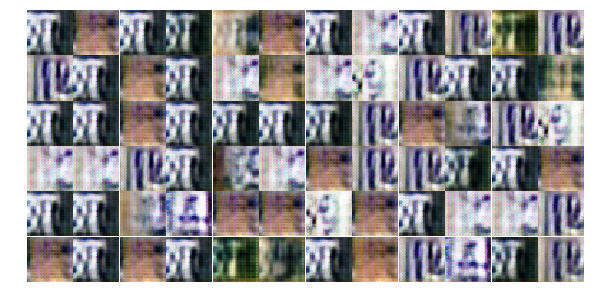

Epoch 10/10 Qfunction Loss:9.3143 Generator Loss:6.8230 Discriminator Loss:0.1930
Epoch 10/10 Qfunction Loss:10.2074 Generator Loss:6.0579 Discriminator Loss:0.8325
Epoch 10/10 Qfunction Loss:11.2105 Generator Loss:6.5176 Discriminator Loss:0.2754


In [23]:
losses, samples = train(model=model, dataset=dataset, epochs=epochs, batch_size=batch_size, figsize=(10,5))

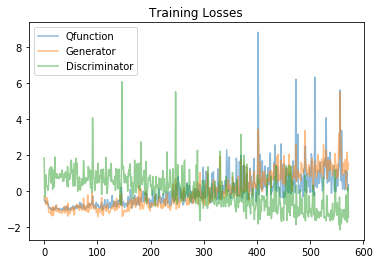

In [24]:
fig, ax = plt.subplots()
losses_ = np.array(losses)
losses_norm = (losses_ - losses_.mean(axis=0))/losses_.std(axis=0)
plt.plot(losses_norm.T[0], label='Qfunction', alpha=0.5)
plt.plot(losses_norm.T[1], label='Generator', alpha=0.5)
plt.plot(losses_norm.T[2], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

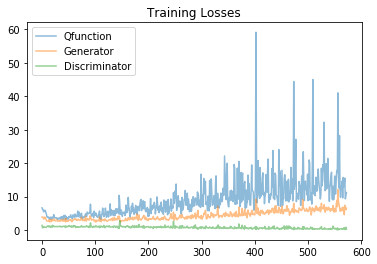

In [25]:
fig, ax = plt.subplots()
plt.plot(losses_.T[0], label='Qfunction', alpha=0.5)
plt.plot(losses_.T[1], label='Generator', alpha=0.5)
plt.plot(losses_.T[2], label='Discriminator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/matplotlib/axes/_base.py:1400: MatplotlibDeprecationWarning: The 'box-forced' keyword argument is deprecated since 2.2.
  " since 2.2.", cbook.mplDeprecation)


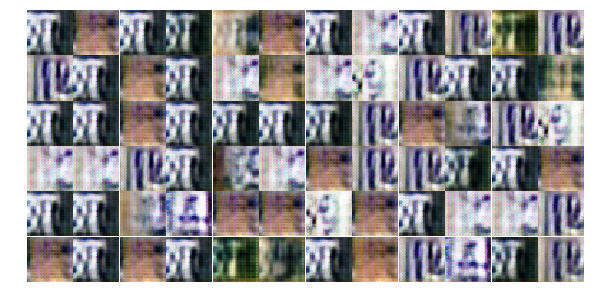

In [26]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

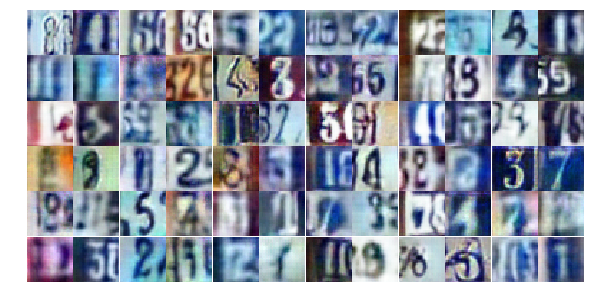

In [19]:
# Standard DCGAN
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))